## Import Libraries and Data Review

In [556]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

%matplotlib inline 

from scipy import stats
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import Lasso, LassoCV
from sklearn.linear_model import ElasticNet, ElasticNetCV

from sklearn.model_selection import cross_val_score, cross_validate

from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

from yellowbrick.regressor import ResidualsPlot, PredictionError

import warnings
warnings.filterwarnings("ignore")

plt.rcParams["figure.figsize"] = (10,6)   
pd.set_option('display.max_columns', 500) 
pd.set_option('display.max_rows', 500)    
pd.options.display.float_format = '{:.3f}'.format

In [557]:
df0 = pd.read_csv("final_scout_not_dummy.csv")
df = df0.copy()

In [558]:
df.shape

(15915, 23)

In [559]:
df.head()

,make_model,body_type,price,vat,km,Type,Fuel,Gears,Comfort_Convenience,Entertainment_Media,Extras,Safety_Security,age,Previous_Owners,hp_kW,Inspection_new,Paint_Type,Upholstery_type,Gearing_Type,Displacement_cc,Weight_kg,Drive_chain,cons_comb
0,Audi A1,Sedans,15770,VAT deductible,56013.000,Used,Diesel,7.000,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Catalytic Converter,Voice Control","ABS,Central door lock,Daytime running lights,D...",3.000,2.000,66.000,1,Metallic,Cloth,Automatic,1422.000,1220.000,front,3.800
1,Audi A1,Sedans,14500,Price negotiable,80000.000,Used,Benzine,7.000,"Air conditioning,Automatic climate control,Hil...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Sport seats,Sport suspension,Voic...","ABS,Central door lock,Central door lock with r...",2.000,1.000,141.000,0,Metallic,Cloth,Automatic,1798.000,1255.000,front,5.600
2,Audi A1,Sedans,14640,VAT deductible,83450.000,Used,Diesel,7.000,"Air conditioning,Cruise control,Electrical sid...","MP3,On-board computer","Alloy wheels,Voice Control","ABS,Central door lock,Daytime running lights,D...",3.000,1.000,85.000,0,Metallic,Cloth,Automatic,1598.000,1135.000,front,3.800
3,Audi A1,Sedans,14500,VAT deductible,73000.000,Used,Diesel,6.000,"Air suspension,Armrest,Auxiliary heating,Elect...","Bluetooth,CD player,Hands-free equipment,MP3,O...","Alloy wheels,Sport seats,Voice Control","ABS,Alarm system,Central door lock with remote...",3.000,1.000,66.000,0,Metallic,Cloth,Automatic,1422.000,1195.000,front,3.800
4,Audi A1,Sedans,16790,VAT deductible,16200.000,Used,Diesel,7.000,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Hands-free equipment,MP3,O...","Alloy wheels,Sport package,Sport suspension,Vo...","ABS,Central door lock,Driver-side airbag,Elect...",3.000,1.000,66.000,1,Metallic,Cloth,Automatic,1422.000,1135.000,front,4.100


In [560]:
df.tail()

,make_model,body_type,price,vat,km,Type,Fuel,Gears,Comfort_Convenience,Entertainment_Media,Extras,Safety_Security,age,Previous_Owners,hp_kW,Inspection_new,Paint_Type,Upholstery_type,Gearing_Type,Displacement_cc,Weight_kg,Drive_chain,cons_comb
15910,Renault Espace,Van,39950,VAT deductible,1647.363,New,Diesel,6.000,"Air conditioning,Automatic climate control,Cru...","Bluetooth,Digital radio,Hands-free equipment,O...","Alloy wheels,Touch screen","ABS,Central door lock,Central door lock with r...",0.000,1.000,147.000,0,Metallic,Part/Full Leather,Automatic,1997.000,1758.000,front,5.300
15911,Renault Espace,Van,39885,VAT deductible,9900.000,Used,Benzine,7.000,"Air conditioning,Automatic climate control,Cru...","Bluetooth,Digital radio,Hands-free equipment,R...","Alloy wheels,Touch screen,Voice Control","ABS,Adaptive Cruise Control,Blind spot monitor...",0.000,1.000,165.000,0,Metallic,Cloth,Automatic,1798.000,1708.000,front,7.400
15912,Renault Espace,Van,39875,VAT deductible,15.000,Pre-registered,Diesel,6.000,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,Hands-free equipment,On-board comput...",Alloy wheels,"ABS,Adaptive Cruise Control,Blind spot monitor...",0.000,1.000,146.000,1,Metallic,Part/Full Leather,Automatic,1997.000,1734.000,front,5.300
15913,Renault Espace,Van,39700,VAT deductible,10.000,Pre-registered,Diesel,6.000,"Air conditioning,Automatic climate control,Cru...","Bluetooth,Digital radio,Radio,USB","Alloy wheels,Touch screen","ABS,Blind spot monitor,Driver-side airbag,Elec...",0.000,1.000,147.000,0,Metallic,Part/Full Leather,Automatic,1997.000,1758.000,front,5.300
15914,Renault Espace,Van,40999,VAT deductible,1647.363,Demonstration,Benzine,6.000,"Air conditioning,Automatic climate control,Cru...",USB,"Alloy wheels,Touch screen","ABS,Blind spot monitor,Daytime running lights,...",0.000,1.000,165.000,1,Metallic,Part/Full Leather,Automatic,1798.000,1685.000,4WD,6.800


<a id="exploratory-data-analysis"></a>
# <font color= #FFFFFF> <b> Exploratory Data Analysis (EDA)</b><font color= #FFFFFF>

In [561]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15915 entries, 0 to 15914
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   make_model           15915 non-null  object 
 1   body_type            15915 non-null  object 
 2   price                15915 non-null  int64  
 3   vat                  15915 non-null  object 
 4   km                   15915 non-null  float64
 5   Type                 15915 non-null  object 
 6   Fuel                 15915 non-null  object 
 7   Gears                15915 non-null  float64
 8   Comfort_Convenience  15915 non-null  object 
 9   Entertainment_Media  15915 non-null  object 
 10  Extras               15915 non-null  object 
 11  Safety_Security      15915 non-null  object 
 12  age                  15915 non-null  float64
 13  Previous_Owners      15915 non-null  float64
 14  hp_kW                15915 non-null  float64
 15  Inspection_new       15915 non-null 

In [562]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
price,15915.000,18024.381,7381.679,4950.000,12850.000,16900.000,21900.000,74600.000
km,15915.000,32089.996,36977.215,0.000,1920.500,20413.000,46900.000,317000.000
Gears,15915.000,5.937,0.705,5.000,5.000,6.000,6.000,8.000
age,15915.000,1.390,1.121,0.000,0.000,1.000,2.000,3.000
Previous_Owners,15915.000,1.043,0.339,0.000,1.000,1.000,1.000,4.000
hp_kW,15915.000,88.499,26.674,40.000,66.000,85.000,103.000,294.000
Inspection_new,15915.000,0.247,0.431,0.000,0.000,0.000,0.000,1.000
Displacement_cc,15915.000,1428.662,275.804,890.000,1229.000,1461.000,1598.000,2967.000
Weight_kg,15915.000,1337.701,199.682,840.000,1165.000,1295.000,1472.000,2471.000
cons_comb,15915.000,4.832,0.868,3.000,4.100,4.800,5.400,9.100


In [563]:
df.describe(include="object").T

,count,unique,top,freq
make_model,15915,9,Audi A3,3097
body_type,15915,8,Sedans,8004
vat,15915,2,VAT deductible,15044
Type,15915,5,Used,11095
Fuel,15915,4,Benzine,8548
Comfort_Convenience,15915,6196,"Air conditioning,Electrical side mirrors,Hill ...",388
Entertainment_Media,15915,346,"Bluetooth,Hands-free equipment,On-board comput...",1737
Extras,15915,659,Alloy wheels,5785
Safety_Security,15915,4442,"ABS,Central door lock,Daytime running lights,D...",729
Paint_Type,15915,3,Metallic,15246


## Handling Missing Values

In [564]:
df.isnull().sum().sum()

0

## Detection of Duplicate

In [565]:
duplicate_rows = df.duplicated()
duplicate_count = duplicate_rows.sum()

In [566]:
duplicate_count

1673

In [567]:
# Checks for duplicate observations in the data set and removes them

def duplicate_values(df):
    print("Duplicate check...")
    num_duplicates = df.duplicated(subset=None, keep='first').sum()
    if num_duplicates > 0:
        print("There are", num_duplicates, "duplicated observations in the dataset.")
        df.drop_duplicates(keep='first', inplace=True)
        print(num_duplicates, "duplicates were dropped!")
        print("No more duplicate rows!")
    else:
        print("There are no duplicated observations in the dataset.")

In [568]:
duplicate_values(df)

Duplicate check...
There are 1673 duplicated observations in the dataset.
1673 duplicates were dropped!
No more duplicate rows!


In [569]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
price,14242.000,18100.969,7421.214,4950.000,12950.000,16950.000,21900.000,74600.000
km,14242.000,32582.110,36856.863,0.000,3898.000,21000.000,47000.000,317000.000
Gears,14242.000,5.940,0.703,5.000,5.000,6.000,6.000,8.000
age,14242.000,1.415,1.110,0.000,0.000,1.000,2.000,3.000
Previous_Owners,14242.000,1.041,0.337,0.000,1.000,1.000,1.000,4.000
hp_kW,14242.000,88.713,26.548,40.000,66.000,85.000,103.000,294.000
Inspection_new,14242.000,0.256,0.437,0.000,0.000,0.000,1.000,1.000
Displacement_cc,14242.000,1432.890,277.507,890.000,1229.000,1461.000,1598.000,2967.000
Weight_kg,14242.000,1342.399,201.247,840.000,1165.000,1320.000,1487.000,2471.000
cons_comb,14242.000,4.825,0.862,3.000,4.100,4.800,5.400,9.100


## Features Summary

In [178]:
# !pip install ipywidgets ydata-profiling
#from ydata_profiling import ProfileReport
#profile = ProfileReport(df, title="Profiling Report")
#profile.to_file("profiling_report.html")

In [570]:
# Let's observe our data in a table 

def get_unique_values(df):
    
    output_data = []

    for col in df.columns:

        # If the number of unique values in the column is less than or equal to 5
        if df.loc[:, col].nunique() <= 10:
            # Get the unique values in the column
            unique_values = df.loc[:, col].unique()
            # Append the column name, number of unique values, unique values, and data type to the output data
            output_data.append([col, df.loc[:, col].nunique(), unique_values, df.loc[:, col].dtype])
        else:
            # Otherwise, append only the column name, number of unique values, and data type to the output data
            output_data.append([col, df.loc[:, col].nunique(),"-", df.loc[:, col].dtype])

    output_df = pd.DataFrame(output_data, columns=['Column Name', 'Number of Unique Values', ' Unique Values ', 'Data Type'])

    return output_df

In [571]:
get_unique_values(df)

,Column Name,Number of Unique Values,Unique Values,Data Type
0,make_model,9,"[Audi A1, Audi A2, Audi A3, Opel Astra, Opel C...",object
1,body_type,8,"[Sedans, Station wagon, Compact, Coupe, Van, O...",object
2,price,2952,-,int64
3,vat,2,"[VAT deductible, Price negotiable]",object
4,km,6691,-,float64
5,Type,5,"[Used, Employee's car, New, Demonstration, Pre...",object
6,Fuel,4,"[Diesel, Benzine, LPG/CNG, Electric]",object
7,Gears,4,"[7.0, 6.0, 5.0, 8.0]",float64
8,Comfort_Convenience,6196,-,object
9,Entertainment_Media,346,-,object


## Categorical Features

In [572]:
df.make_model.unique()

array(['Audi A1', 'Audi A2', 'Audi A3', 'Opel Astra', 'Opel Corsa',
       'Opel Insignia', 'Renault Clio', 'Renault Duster',
       'Renault Espace'], dtype=object)

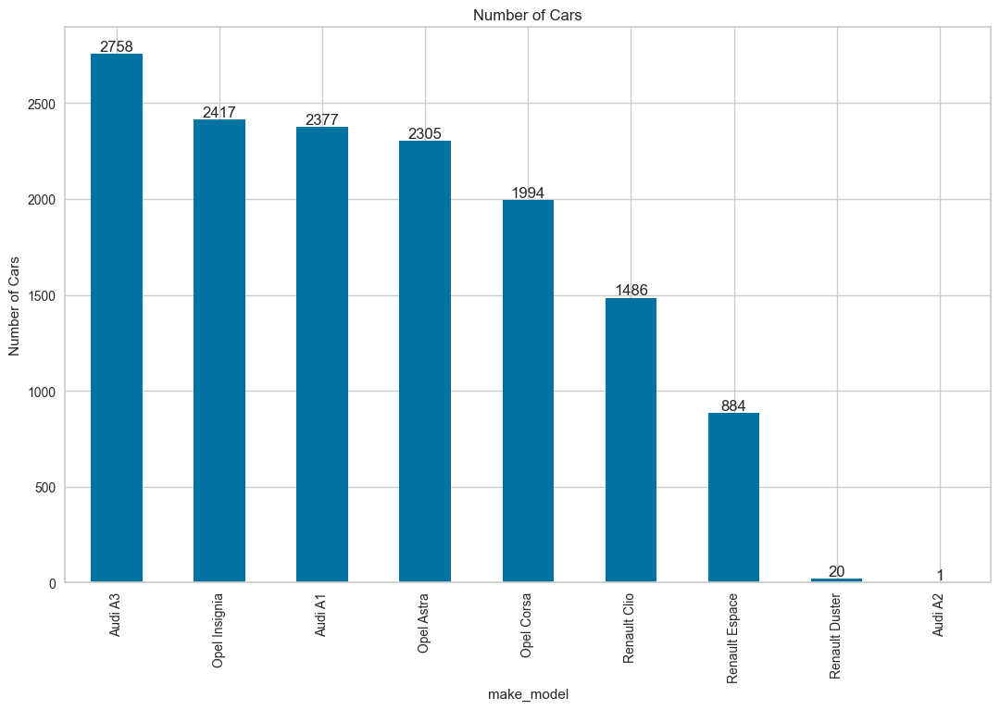

In [573]:
fig = plt.figure(figsize = (10,6))
ax = fig.add_axes([0,0,1,1])
counts = df.make_model.value_counts().sort_values(ascending=False)
counts.plot(kind = "bar")
plt.title('Number of Cars')   
plt.xlabel('make_model') 
plt.ylabel('Number of Cars')
plt.xticks(rotation = 90)
ax.bar_label(ax.containers[0], labels=counts.values, fontsize=12);

In [574]:
df[df.make_model=="Audi A2"]

,make_model,body_type,price,vat,km,Type,Fuel,Gears,Comfort_Convenience,Entertainment_Media,Extras,Safety_Security,age,Previous_Owners,hp_kW,Inspection_new,Paint_Type,Upholstery_type,Gearing_Type,Displacement_cc,Weight_kg,Drive_chain,cons_comb
2614,Audi A2,Off-Road,28200,VAT deductible,26166.000,Employee's car,Diesel,6.000,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Hands-free equipment,MP3,O...",Alloy wheels,"ABS,Adaptive Cruise Control,Central door lock,...",1.000,1.000,85.000,0,Metallic,Cloth,Manual,1598.000,1135.000,front,4.900


In [575]:
df.drop(index=[2614], inplace =True)

We can remove the Audi A2 model from the dataset because a single observation does not significantly affect the model's learning and predictions.

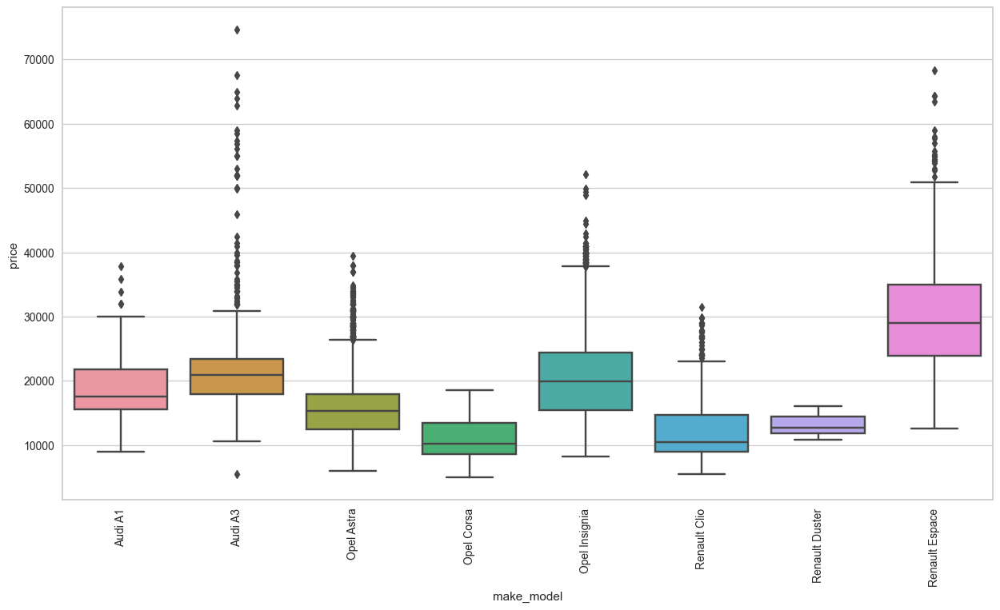

In [576]:
plt.figure(figsize = (15,8))
sns.boxplot(x="make_model", y="price", data=df)
plt.xticks(rotation = 90);

**General Observations**
- Audi A1, A3, Opel Insignia and Renault Espace models generally have higher price ranges.
- Opel Corsa and Renault Clio models generally have lower price ranges.
- The Renault Duster is underrepresented due to the small number of observations and it is therefore difficult to assess their overall distribution.

In [186]:
df.body_type.unique()

array(['Sedans', 'Station wagon', 'Compact', 'Coupe', 'Van',
       'Convertible', 'Off-Road', 'Transporter'], dtype=object)

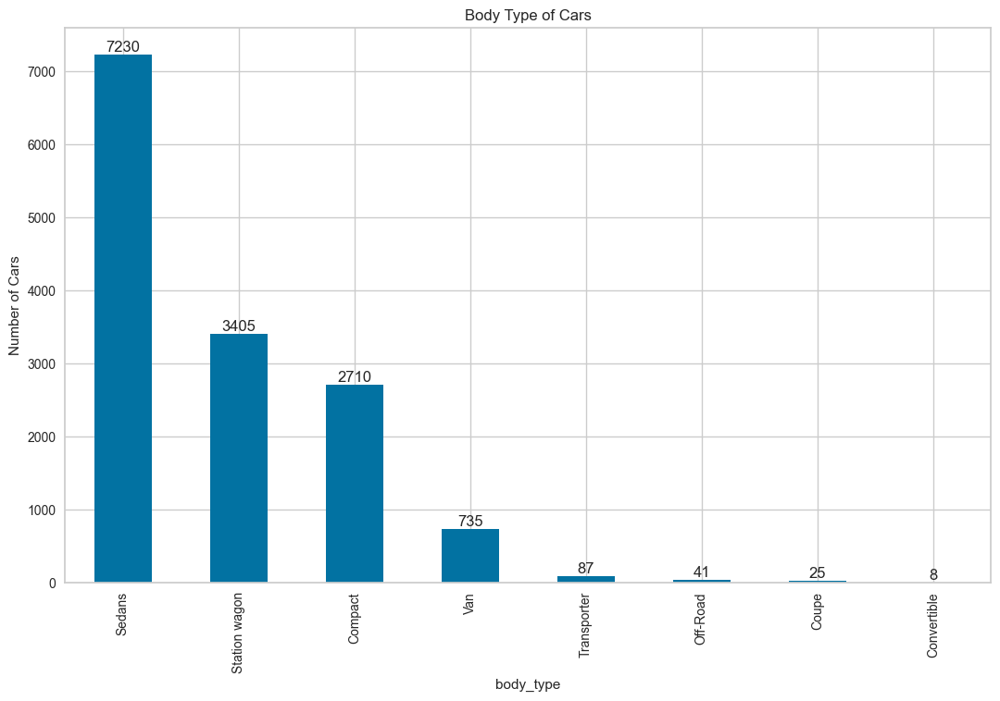

In [187]:
fig = plt.figure(figsize = (10,6))
ax = fig.add_axes([0,0,1,1])
counts = df.body_type.value_counts().sort_values(ascending=False)
counts.plot(kind = "bar")
plt.title('Body Type of Cars')   
plt.xlabel('body_type') 
plt.ylabel('Number of Cars')
plt.xticks(rotation = 90)
ax.bar_label(ax.containers[0], labels=counts.values, fontsize=12);

**General Evaluation**
- Sedans and Station wagon body types constitute the majority of vehicles in the dataset.
- Compact vehicles are also common, but not as much as Sedans and Station wagons.
- Van, Transporter, and Off-Road vehicles are less common.
- Coupe and Convertible vehicles are quite rare.

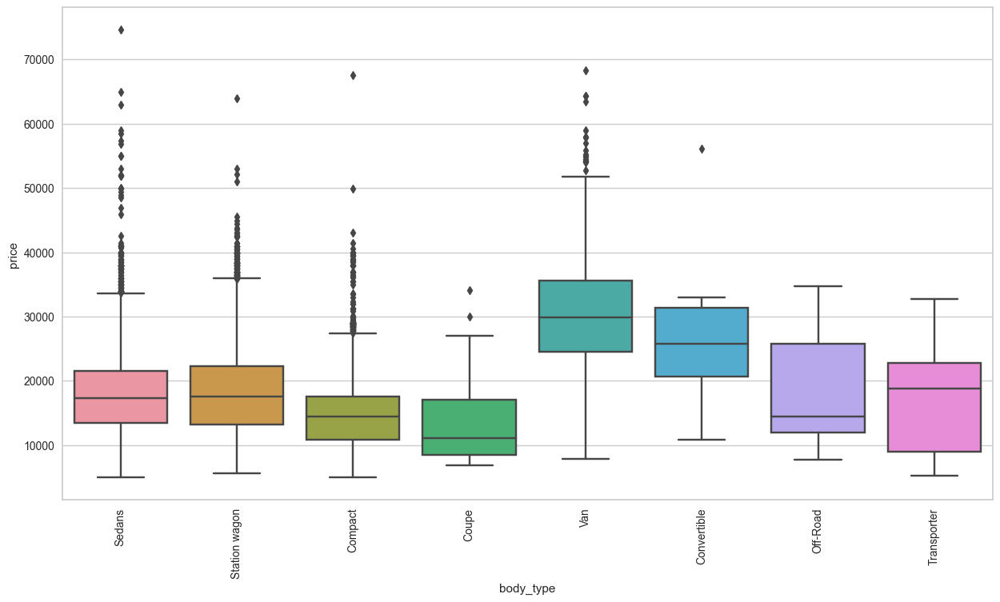

In [188]:
plt.figure(figsize = (15,8))
sns.boxplot(x="body_type", y="price", data=df)
plt.xticks(rotation = 90);

In [189]:
# Recalculate the mean price by model and body type
mean_price_by_model_body_type = df.groupby(['make_model', 'body_type'])['price'].mean().reset_index()

# Define custom color map
custom_colors = {
    'Sedans': 'darkred',
    'Station wagon': 'darkblue',
    'Compact': 'darkgreen',
    'Coupe': 'lightblue',
    'Van': 'lightcyan'
}

# Assign colors to body types not listed in the custom color map
unique_body_types = mean_price_by_model_body_type['body_type'].unique()
for body_type in unique_body_types:
    if body_type not in custom_colors:
        custom_colors[body_type] = 'lightblue'

# Create a bar plot using plotly
fig = px.bar(mean_price_by_model_body_type, 
             x='price', 
             y='make_model', 
             color='body_type', 
             orientation='h',
             color_discrete_map=custom_colors,
             title='Average Price by Model and Body Type',
             labels={'price': 'Average Price', 'make_model': 'Model'},
             height=800)

fig.update_layout(title_font_size=16, xaxis_title_font_size=14, yaxis_title_font_size=14,
                  legend_title_font_size=13, yaxis={'categoryorder':'total ascending'})
fig.show()

**General Evaluation**
- Convertible and Van body types have higher price ranges compared to other body types.
- Compact and Coupe vehicles are concentrated in lower price ranges, indicating that these types of vehicles are generally more economical options.

In [190]:
df.vat.value_counts().sort_values(ascending=False)

vat
VAT deductible      13425
Price negotiable      816
Name: count, dtype: int64

In [191]:
transmission_distr = df['vat'].value_counts().reset_index(name='count')
transmission_distr.columns = ['vat', 'count']  # Make sure this matches your DataFrame columns

fig = px.pie(transmission_distr, values='count', names='vat', title="Vat Distribution")
fig.show()

In [192]:
df.Type.value_counts().sort_values(ascending=False)

Type
Used              10172
New                1369
Pre-registered     1029
Employee's car      904
Demonstration       767
Name: count, dtype: int64

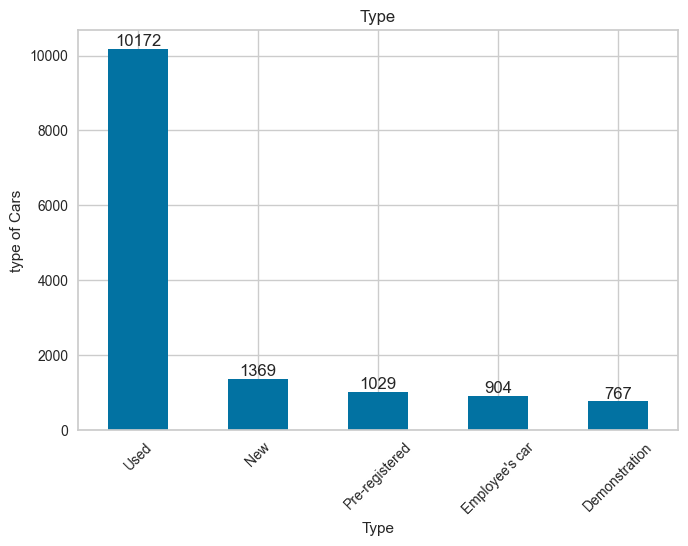

In [193]:
fig = plt.figure(figsize = (6,4))
ax = fig.add_axes([0,0,1,1])
counts = df.Type.value_counts().sort_values(ascending=False).head(20)
counts.plot(kind = "bar")
plt.title('Type')   
plt.xlabel('Type') 
plt.ylabel('type of Cars')
plt.xticks(rotation = 45)
ax.bar_label(ax.containers[0], labels=counts.values, fontsize=12);

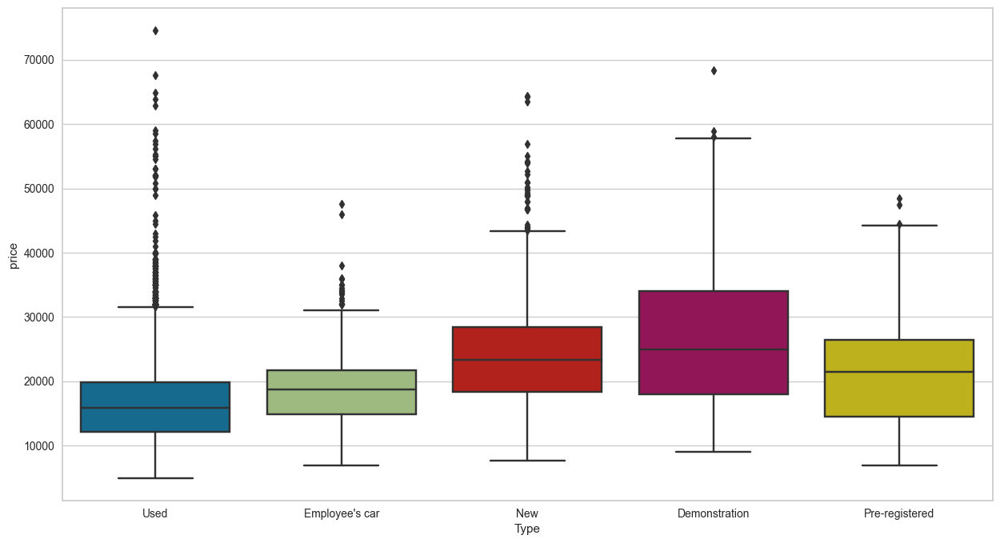

In [194]:
plt.figure(figsize = (15,8))
sns.boxplot(x="Type", y="price", data=df);

In [195]:
df.Fuel.value_counts().sort_values(ascending=False)

Fuel
Benzine     7558
Diesel      6618
LPG/CNG       60
Electric       5
Name: count, dtype: int64

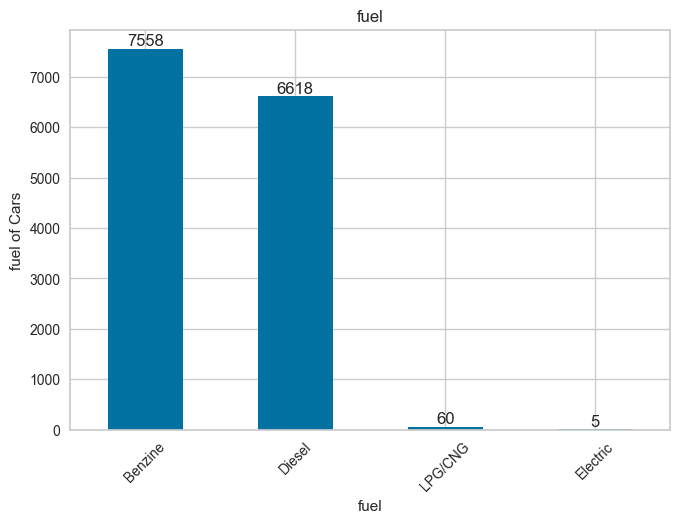

In [196]:
fig = plt.figure(figsize = (6,4))
ax = fig.add_axes([0,0,1,1])
counts = df.Fuel.value_counts().sort_values(ascending=False).head(20)
counts.plot(kind = "bar")
plt.title('fuel')   
plt.xlabel('fuel') 
plt.ylabel('fuel of Cars')
plt.xticks(rotation = 45)
ax.bar_label(ax.containers[0], labels=counts.values, fontsize=12);

<Axes: xlabel='Fuel', ylabel='price'>

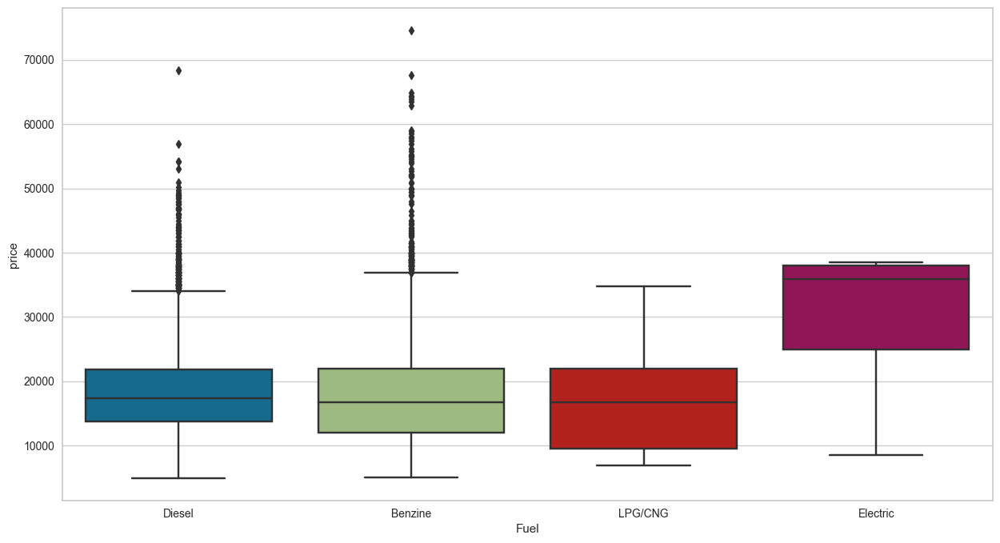

In [197]:
plt.figure(figsize = (15,8))
sns.boxplot(x="Fuel", y="price", data=df)

In [198]:
df[df["Fuel"] == "Electric"]

,make_model,body_type,price,vat,km,Type,Fuel,Gears,Comfort_Convenience,Entertainment_Media,Extras,Safety_Security,age,Previous_Owners,hp_kW,Inspection_new,Paint_Type,Upholstery_type,Gearing_Type,Displacement_cc,Weight_kg,Drive_chain,cons_comb
3356,Audi A3,Compact,24950,VAT deductible,57000.000,Used,Electric,6.000,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Digital radio,Hands-free e...","Alloy wheels,Roof rack,Sport package,Sport sea...","ABS,Adaptive Cruise Control,Adaptive headlight...",3.000,1.000,150.000,0,Metallic,Part/Full Leather,Semi-automatic,1400.000,1280.000,front,4.100
3612,Audi A3,Sedans,38450,Price negotiable,13800.000,Used,Electric,6.000,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Digital radio,Hands-free e...","Alloy wheels,Sport package,Sport seats,Voice C...","ABS,Adaptive Cruise Control,Alarm system,Centr...",1.000,1.000,110.000,0,Metallic,Cloth,Semi-automatic,1395.000,1615.000,front,4.000
3615,Audi A3,Sedans,35899,Price negotiable,20880.000,Used,Electric,6.000,"Air conditioning,Power windows,Seat ventilatio...","Bluetooth,Radio",Alloy wheels,"ABS,Adaptive Cruise Control,Alarm system,Centr...",1.000,1.000,110.000,0,Metallic,Cloth,Semi-automatic,1395.000,1615.000,front,4.000
3617,Audi A3,Sedans,38000,Price negotiable,12000.000,Used,Electric,6.000,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Digital radio,Hands-free e...","Alloy wheels,Shift paddles,Sport package,Sport...","ABS,Adaptive Cruise Control,Adaptive headlight...",1.000,1.000,110.000,0,Metallic,Part/Full Leather,Semi-automatic,1395.000,1615.000,front,4.000
13393,Renault Clio,Sedans,8490,VAT deductible,23863.000,Used,Electric,6.000,"Air conditioning,Cruise control,Navigation system",On-board computer,Alloy wheels,Driver-side airbag,3.000,1.000,55.000,0,Metallic,Part/Full Leather,Automatic,1461.000,1165.000,front,5.000


In [199]:
df.Gears.value_counts().sort_values(ascending=False)

Gears
6.000    7763
5.000    3771
7.000    2504
8.000     203
Name: count, dtype: int64

In [200]:
df.age.value_counts().sort_values(ascending=False)

age
1.000    4282
0.000    3695
3.000    3342
2.000    2922
Name: count, dtype: int64

In [201]:
transmission_distr = df['age'].value_counts().reset_index()
transmission_distr.columns = ['age', 'count']  
fig = px.pie(transmission_distr, values='count', names='age')
fig.update_layout(title="Age Distribution")
fig.show()

In [202]:
df.Previous_Owners.value_counts().sort_values(ascending=False)

Previous_Owners
1.000    12699
2.000     1014
0.000      497
3.000       29
4.000        2
Name: count, dtype: int64

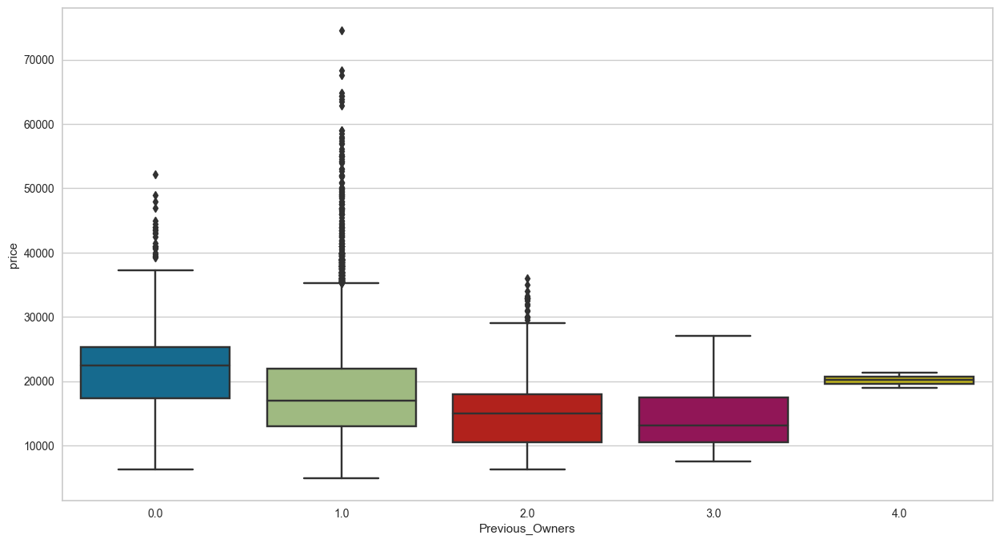

In [219]:
plt.figure(figsize = (15,8))
sns.boxplot(x="Previous_Owners", y="price", data=df);


In [ ]:
df.hp_kW.unique()

In [218]:
fig = px.scatter(df, x='hp_kW', y='price', color='make_model',
                 title='Scatter Plot of Horsepower (kW) vs Price',
                 labels={'hp_kW': 'Horsepower (kW)', 'price': 'Price'},
                 hover_data=['make_model'])

# Enhancing the layout
fig.update_layout(title_font_size=16, xaxis_title_font_size=14, yaxis_title_font_size=14,
                  legend_title_text='Make & Model')

# Showing the interactive plot
fig.show()


**General Evaluation**
- **Positive Correlation Between Horsepower and Price**:

The graph generally shows that as horsepower increases, the price also increases. This indicates that higher performance cars are more expensive.

- **Distribution by Model and Brand**:

Different colors represent different brands and models. There can be significant differences in prices among different brands and models with the same horsepower.
For example, luxury brands (such as Audi, BMW) generally have higher prices, while more economical brands (such as Opel, Renault) have lower prices.

- **Outliers**:

Some brands and models deviate from the general trend, having higher or lower prices. These outliers may be due to special equipment packages or rare models.

In [227]:
df.Inspection_new.value_counts().sort_values(ascending=False)

Inspection_new
0    10591
1     3650
Name: count, dtype: int64

In [228]:
df.Paint_Type.value_counts().sort_values(ascending=False) 

Paint_Type
Metallic       13681
Uni/basic        549
Perl effect       11
Name: count, dtype: int64

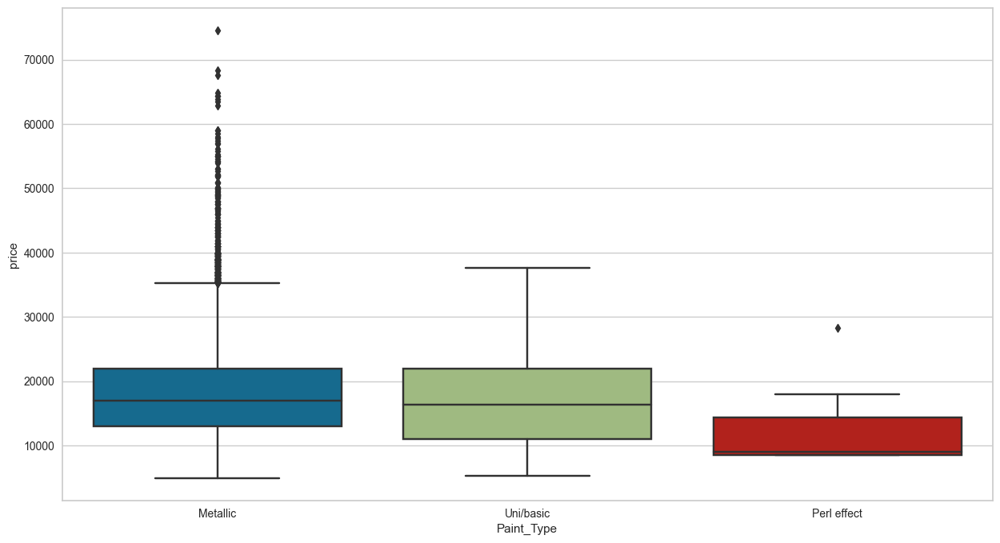

In [229]:
plt.figure(figsize = (15,8))
sns.boxplot(x="Paint_Type", y="price", data=df);

**General Evaluation**

This graph helps us understand the impact of paint type on car prices. Metallic and Uni/Basic painted cars are generally sold at higher prices, with metallic painted cars having many outliers at very high prices. Perl Effect painted cars, on the other hand, are generally sold at lower prices.

In [230]:
df.Upholstery_type.value_counts().sort_values(ascending=False) 

Upholstery_type
Cloth                10917
Part/Full Leather     3324
Name: count, dtype: int64

In [231]:
transmission_distr = df['Upholstery_type'].value_counts().reset_index()
transmission_distr.columns = ['Upholstery_type', 'count']  
fig = px.pie(transmission_distr, values='count', names='Upholstery_type')
fig.update_layout(title="Upholstery_type Distribution")
fig.show()

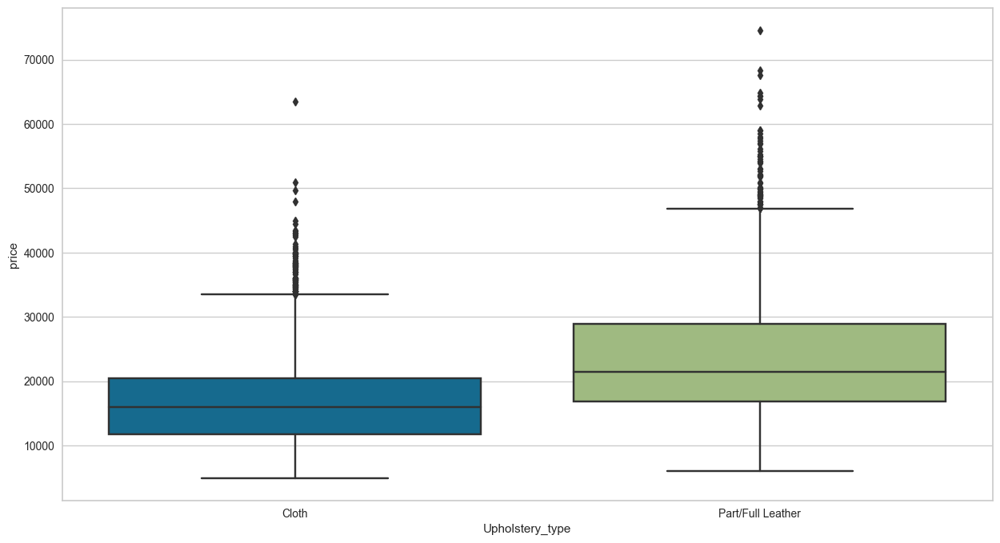

In [232]:
plt.figure(figsize = (15,8))
sns.boxplot(x="Upholstery_type", y="price", data=df);

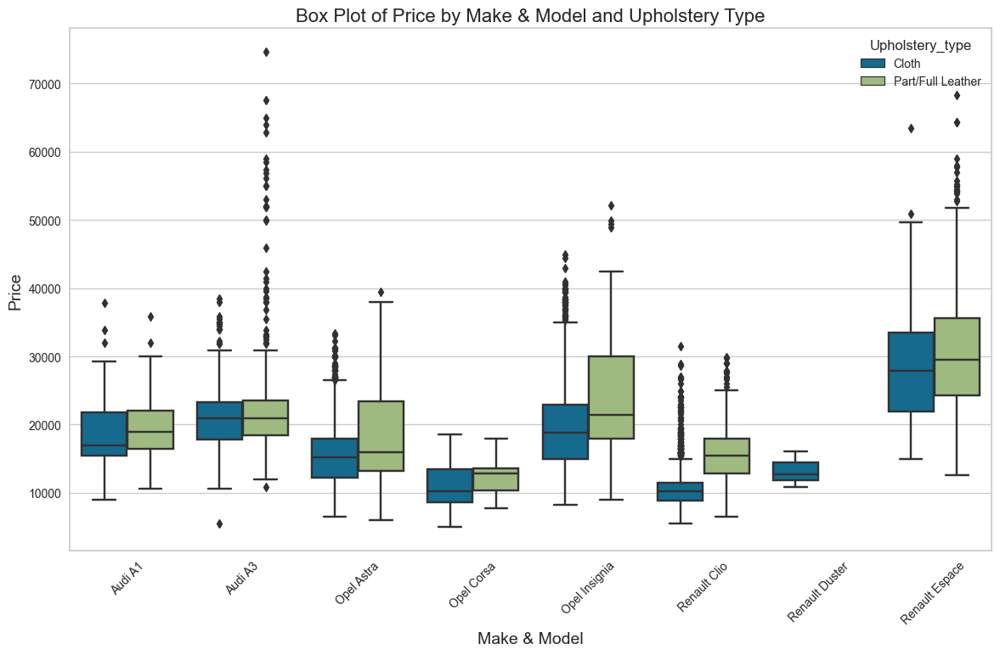

In [233]:
plt.figure(figsize=(14, 8))

sns.boxplot(x='make_model', y='price', hue='Upholstery_type', data=df)

plt.title('Box Plot of Price by Make & Model and Upholstery Type', fontsize=16)
plt.xlabel('Make & Model', fontsize=14)
plt.ylabel('Price', fontsize=14)
plt.xticks(rotation=45)
plt.show()


**General Evaluation**:
- Median Prices: The median price of vehicles with leather upholstery is higher than the median price of vehicles with cloth upholstery.
- Price Distribution: Vehicles with leather upholstery are generally sold at higher prices. The price range for leather-upholstered vehicles is wider and includes outliers with higher prices.
- Outliers: Both types of upholstery have outliers, but vehicles with leather upholstery have outliers with higher prices.

In [234]:
df.Gearing_Type.value_counts().sort_values(ascending=False) 

Gearing_Type
Manual            7231
Automatic         6546
Semi-automatic     464
Name: count, dtype: int64

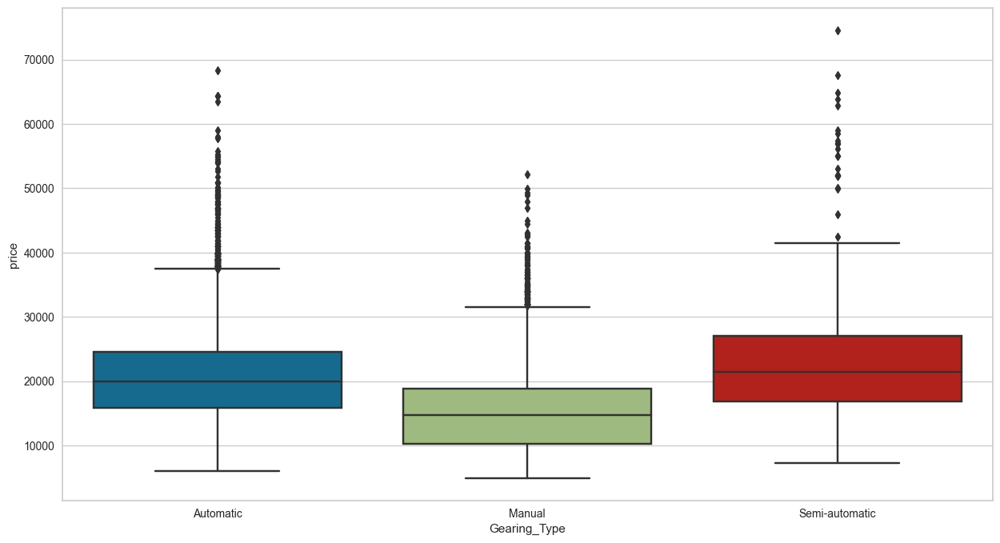

In [235]:
plt.figure(figsize = (15,8))
sns.boxplot(x="Gearing_Type", y="price", data=df);

In [236]:
df.Drive_chain.value_counts().sort_values(ascending=False) 

Drive_chain
front    14066
4WD        171
rear         4
Name: count, dtype: int64

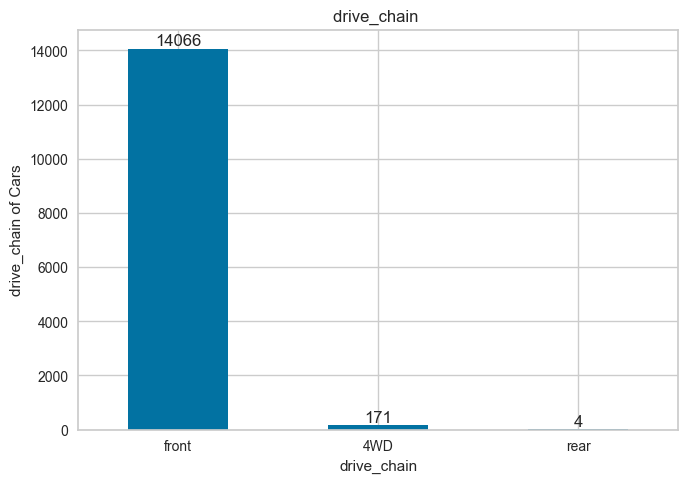

In [237]:
fig = plt.figure(figsize = (6,4))
ax = fig.add_axes([0,0,1,1])
counts = df.Drive_chain.value_counts().sort_values(ascending=False).head(20)
counts.plot(kind = "bar")
plt.title('drive_chain ')   
plt.xlabel('drive_chain') 
plt.ylabel('drive_chain of Cars')
plt.xticks(rotation = 0)
ax.bar_label(ax.containers[0], labels=counts.values, fontsize=12);

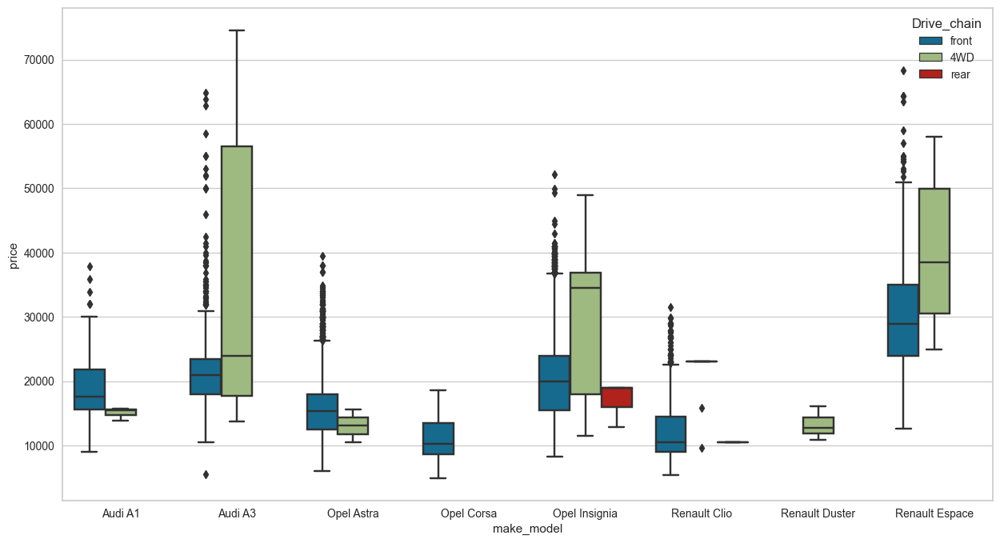

In [238]:
plt.figure(figsize = (15,8))
sns.boxplot(x="make_model", y="price", hue = "Drive_chain", data=df);

**General Evaluation**:
- Front-Wheel Drive (Front): This is the most common type of drive chain and has a wide price range. Outliers are generally found at higher prices.
- Four-Wheel Drive (4WD): This is moderately common and generally has higher prices. The price range is wide, and outliers are found at high prices.
- Rear-Wheel Drive (Rear): This is the least common type of drive chain and has lower prices. There are no outliers.

## Numerical Features

In [239]:
df.km.unique()

array([5.6013e+04, 8.0000e+04, 8.3450e+04, ..., 2.8640e+03, 1.5060e+03,
       5.7000e+01])

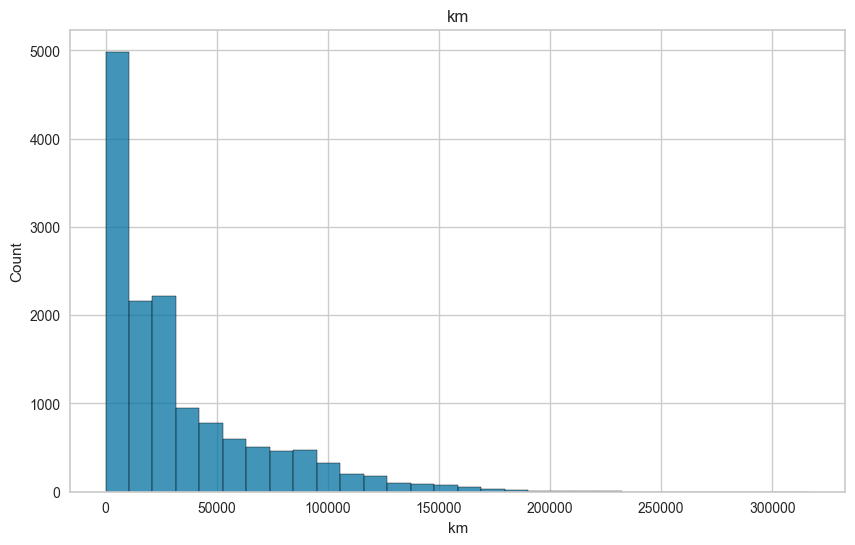

In [240]:
sns.histplot(data=df, x="km", bins=30)
plt.title('km');

**General Evaluation**:
- **New and Lightly Used Cars**: In most models, new (0-10k km) and lightly used (10k-50k km) cars are the most common. This indicates that the market has more new or lightly used cars available.
- **Moderately Used Cars**: Moderately used cars (50k-100k km) are less common in most models.
- **High Mileage Cars**: High mileage cars (>100k km) are quite rare in most models.
- **Right Skewness**: This graph helps us understand the mileage status of cars in different models. Generally, low mileage cars are more prevalent, indicating a right-skewed distribution.

In [241]:
df.Displacement_cc.unique()

array([1422., 1798., 1598.,  999., 1395.,  929., 1596., 1600., 1000.,
       1984., 1498., 1197.,  995.,  998., 1968., 1400., 2000., 1568.,
       1896., 2480., 1499., 1495., 1398., 1584.,  997., 1399., 1364.,
       1490.,  996., 1696., 1686., 1396., 1368., 1397., 1248., 1229.,
       1300., 1200.,  973., 1239., 1350., 1369., 1390., 1198., 1195.,
       1956., 1998., 2967., 1856., 1500., 1496., 1533., 1599., 1995.,
       1461., 1618., 1149., 1199.,  898.,  890.,  900., 1100., 1333.,
        899., 1589., 1580., 1997., 1800.])

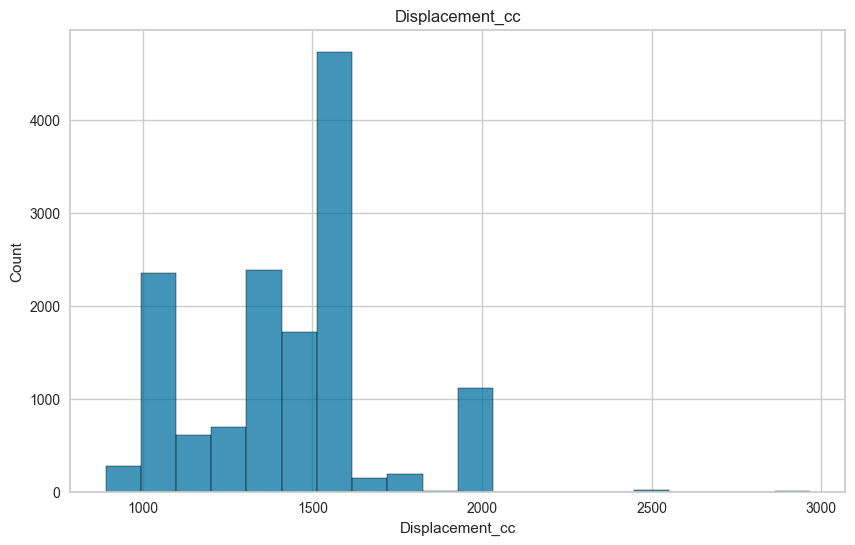

In [242]:
sns.histplot(data=df, x="Displacement_cc", bins=20)
plt.title('Displacement_cc');

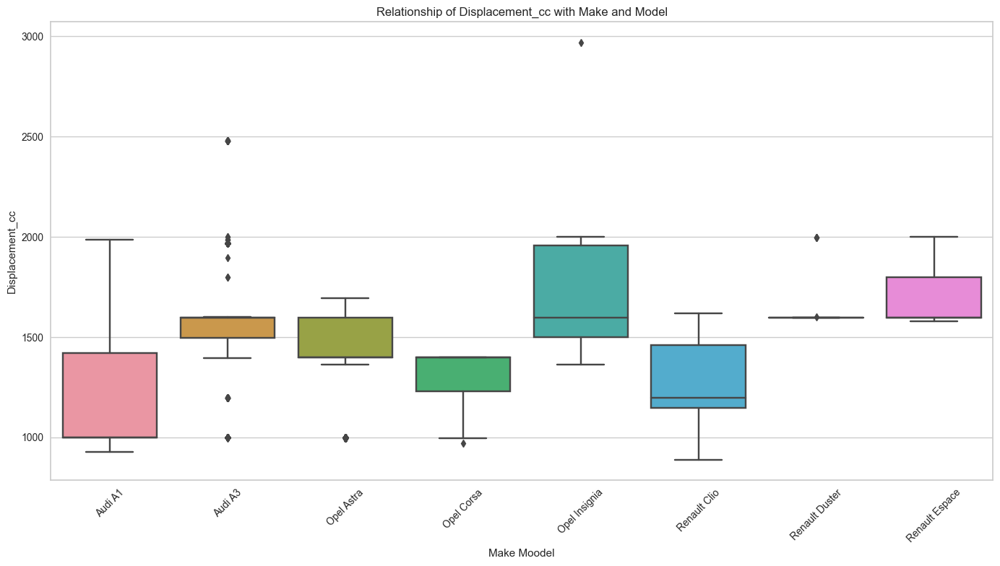

In [243]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=df, x='make_model', y='Displacement_cc')
plt.title('Relationship of Displacement_cc with Make and Model')
plt.xlabel('Make Moodel')
plt.ylabel('Displacement_cc')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

**General Evaluation**:
- **Engine Displacement**: For most makes and models, the engine displacement is generally concentrated between 1000 cc and 2000 cc.
- **Outliers**: Some models have outliers reaching up to 2500 cc and 3000 cc.
- **Brand and Model Differences**: Engine displacements vary across different makes and models. For example, the Opel Insignia and Renault Espace generally have higher engine displacements.

 Motor hacmini santimetreküp (cc) cinsinden belirtir.

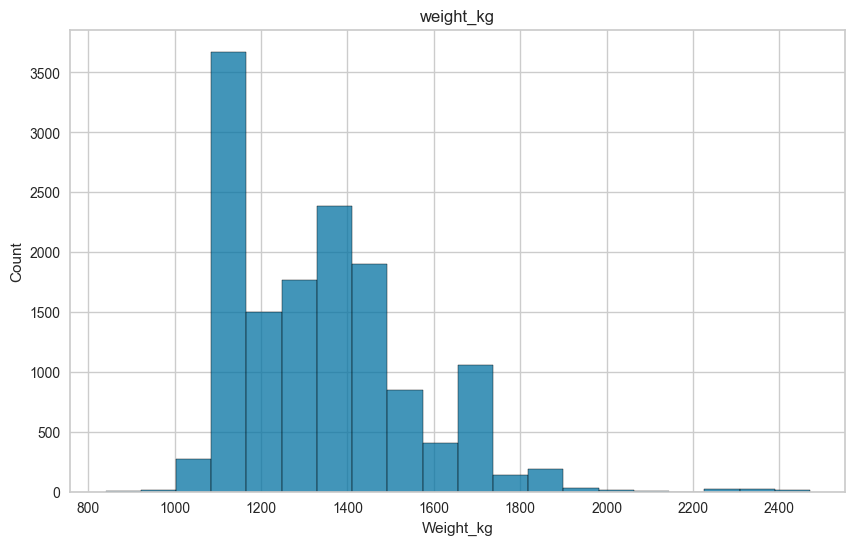

In [244]:
sns.histplot(data=df, x="Weight_kg", bins=20)
plt.title('weight_kg');

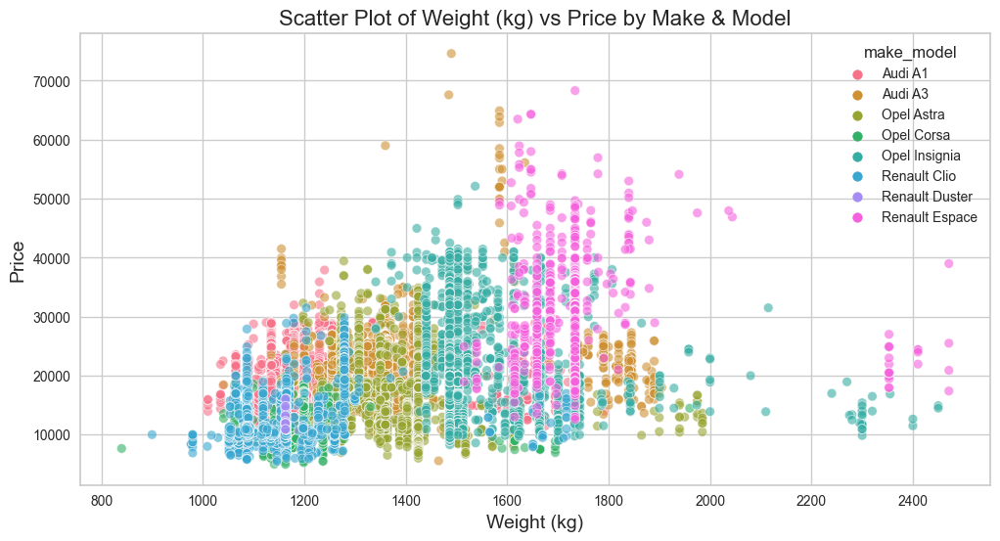

In [245]:
plt.figure(figsize=(12, 6))

sns.scatterplot(x='Weight_kg', y='price', data=df, hue='make_model', alpha=0.6)

plt.title('Scatter Plot of Weight (kg) vs Price by Make & Model', fontsize=16)
plt.xlabel('Weight (kg)', fontsize=14)
plt.ylabel('Price', fontsize=14)
plt.show()


**General Evaluation**:
- **Weight and Price Relationship**: Generally, as weight increases, price also increases. Heavier vehicles typically have higher prices.
- **Model Differences**: There are significant differences in the weights and prices of vehicles across different makes and models.
- **Outliers**: Some models, especially heavier vehicles, have high-priced outliers.

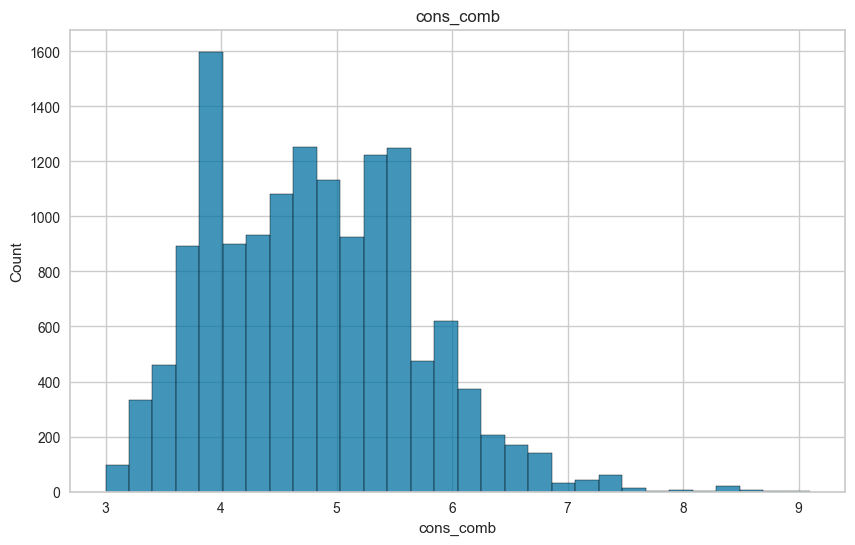

In [246]:
sns.histplot(data=df, x="cons_comb", bins=30)
plt.title('cons_comb');

In [247]:
import plotly.express as px

# Creating an interactive scatter plot with 'cons_comb', 'price' and 'make_model'
fig = px.scatter(df, x='cons_comb', y='price', color='make_model',
                 title='Scatter Plot of Combined Consumption (cons_comb) vs Price by Make & Model',
                 labels={'cons_comb': 'Combined Consumption (L/100km)', 'price': 'Price'},
                 size_max=10, opacity=0.6)

# Enhancing the layout and removing the legend
fig.update_layout(title_font_size=16, xaxis_title_font_size=14, yaxis_title_font_size=14,
                  showlegend=False)

# Displaying the interactive plot
fig.show()


**General Evaluation**:
- **Fuel Consumption and Price Relationship**: Generally, vehicles with low and moderate fuel consumption have lower and more common prices, while vehicles with high fuel consumption have more variable and higher prices.
- **Model Differences**: There are significant differences in fuel consumption and prices of vehicles across different makes and models.
- **Outliers**: Some models, especially those with high fuel consumption, have high-priced outliers

## Text Features

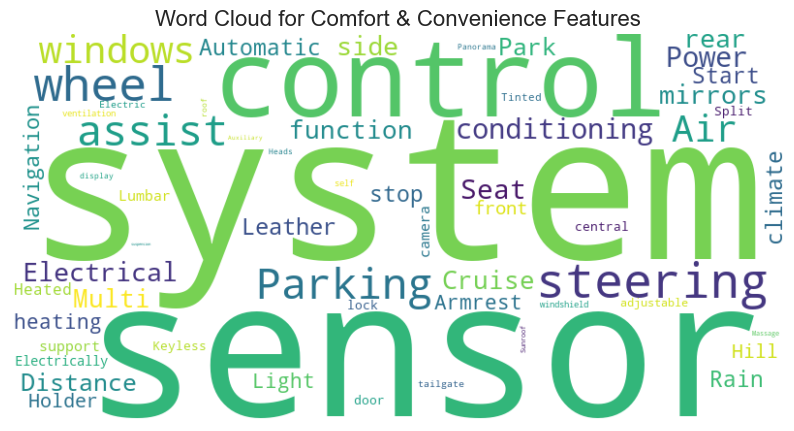

In [248]:
from wordcloud import WordCloud

text_data = ' '.join(df['Comfort_Convenience'].dropna().values)

wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', collocations=False).generate(text_data)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Comfort & Convenience Features', fontsize=16)
plt.show()


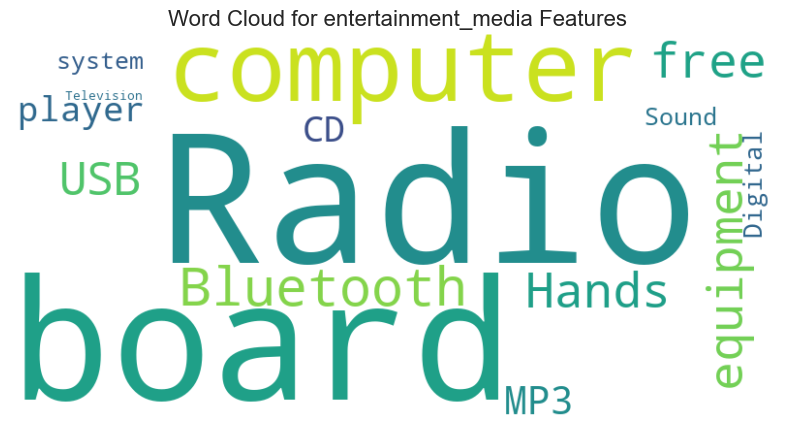

In [249]:
from wordcloud import WordCloud

text_data = ' '.join(df['Entertainment_Media'].dropna().values)

wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', collocations=False).generate(text_data)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for entertainment_media Features', fontsize=16)
plt.show()


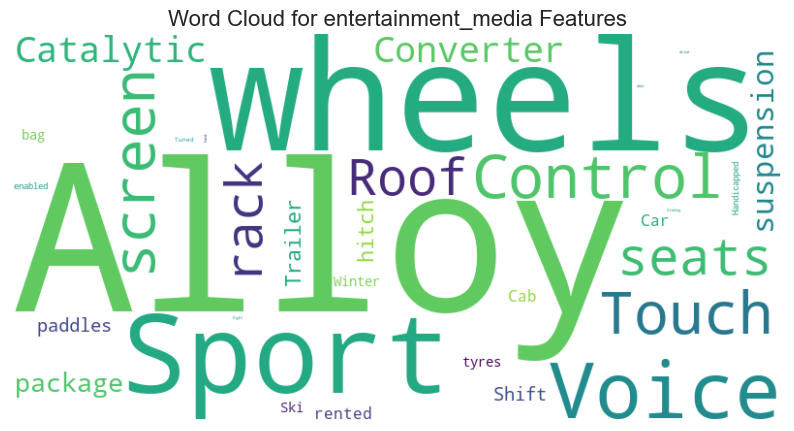

In [250]:
from wordcloud import WordCloud

text_data = ' '.join(df['Extras'].dropna().values)

wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', collocations=False).generate(text_data)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for entertainment_media Features', fontsize=16)
plt.show()


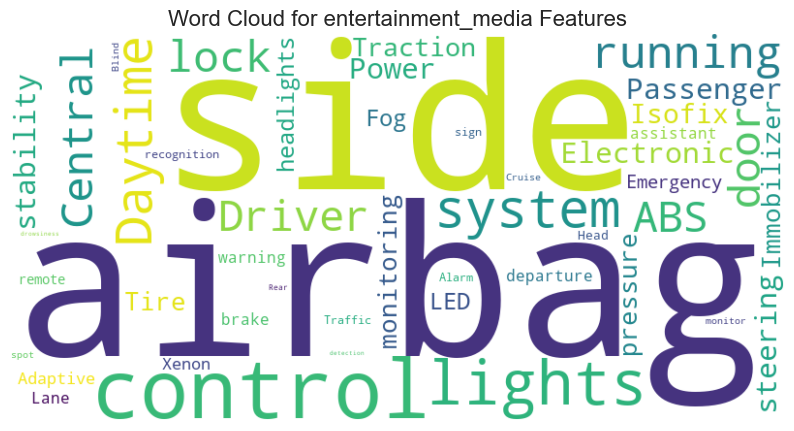

In [251]:
from wordcloud import WordCloud

text_data = ' '.join(df['Safety_Security'].dropna().values)

wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', collocations=False).generate(text_data)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for entertainment_media Features', fontsize=16)
plt.show()


## Target

In [252]:
df[df.price == df.price.min()]

,make_model,body_type,price,vat,km,Type,Fuel,Gears,Comfort_Convenience,Entertainment_Media,Extras,Safety_Security,age,Previous_Owners,hp_kW,Inspection_new,Paint_Type,Upholstery_type,Gearing_Type,Displacement_cc,Weight_kg,Drive_chain,cons_comb
8825,Opel Corsa,Sedans,4950,VAT deductible,179521.000,Used,Diesel,5.000,"Air conditioning,Automatic climate control,Ele...","Bluetooth,CD player,MP3,On-board computer,USB",Alloy wheels,"ABS,Central door lock with remote control,Driv...",3.000,1.000,70.000,0,Metallic,Cloth,Manual,1248.000,1163.000,front,3.200


In [253]:
df[df.price == df.price.max()]

,make_model,body_type,price,vat,km,Type,Fuel,Gears,Comfort_Convenience,Entertainment_Media,Extras,Safety_Security,age,Previous_Owners,hp_kW,Inspection_new,Paint_Type,Upholstery_type,Gearing_Type,Displacement_cc,Weight_kg,Drive_chain,cons_comb
3648,Audi A3,Sedans,74600,VAT deductible,13000.000,Used,Benzine,7.000,"Air conditioning,Armrest,Automatic climate con...","CD player,On-board computer,Radio","Alloy wheels,Sport seats,Sport suspension","ABS,Alarm system,Central door lock,Driver-side...",1.000,1.000,294.000,0,Metallic,Part/Full Leather,Semi-automatic,2480.000,1490.000,4WD,8.300


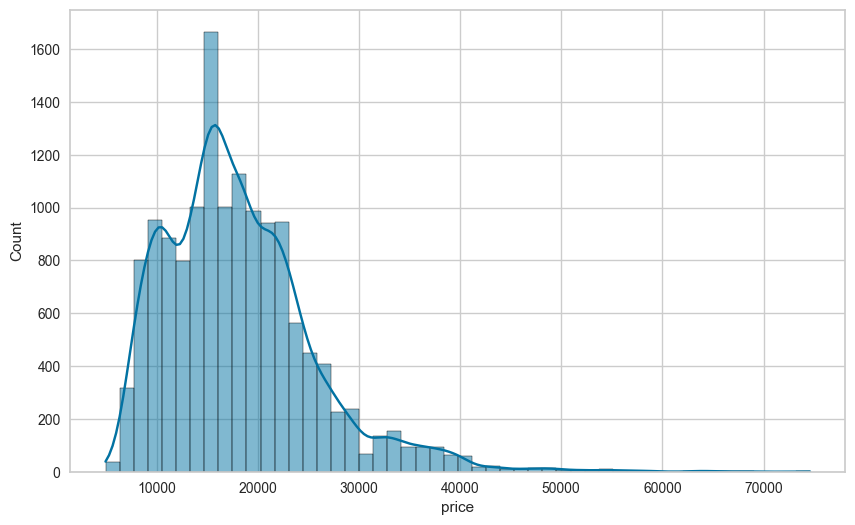

In [254]:
sns.histplot(df.price, bins=50, kde=True);

<a id="detection-of-outliers"></a>
# <font color= #FFFFFF> <b> Detection of Outliers </b><font color= #FFFFFF>

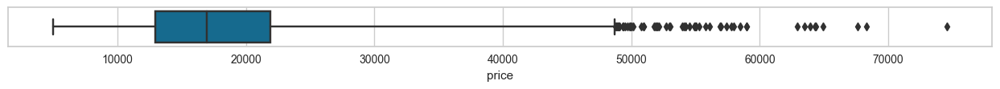

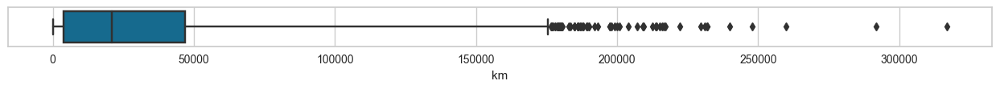

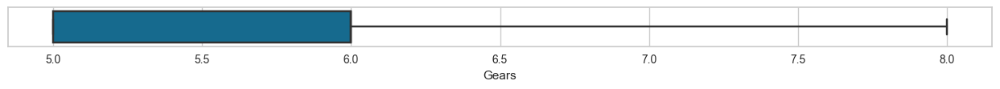

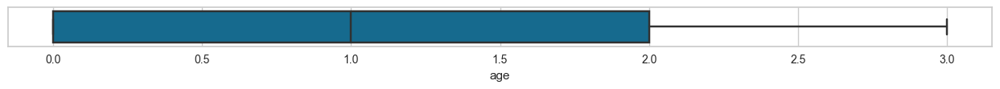

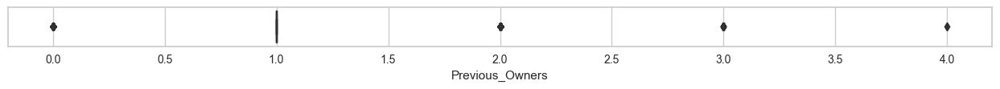

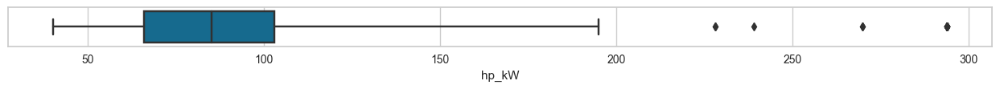

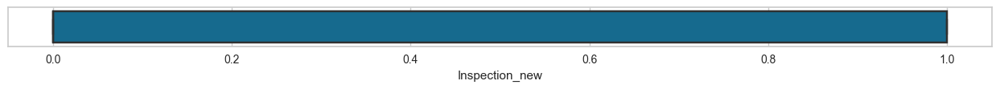

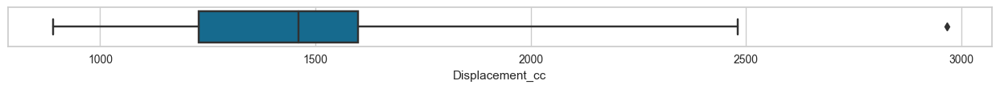

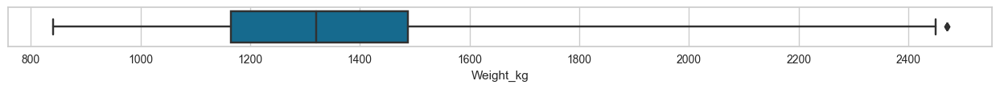

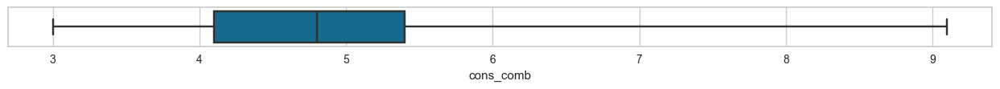

In [255]:
index=0
for feature in df.select_dtypes('number').columns:
    index+=1
    plt.figure(figsize=(25,25))
    plt.subplot((len(df.columns)),2,index)
    sns.boxplot(x=feature,data=df,whis=3) 
        
    plt.tight_layout()
    
    plt.show()

In [256]:
total_outliers = []

for model in df.make_model.unique():
    
    car_prices = df[df["make_model"]== model]["price"]
    
    Q1 = car_prices.quantile(0.25)
    Q3 = car_prices.quantile(0.75)
    IQR = Q3-Q1
    lower_lim = Q1-1.5*IQR
    upper_lim = Q3+1.5*IQR
    
    count_of_outliers = (car_prices[(car_prices < lower_lim) | (car_prices > upper_lim)]).count()
    
    total_outliers.append(count_of_outliers)
    
    print(f" The count of outlier for {model:<15} : {count_of_outliers:<5}, \
          The rate of outliers : {(count_of_outliers/len(df[df['make_model']== model])).round(3)}")
print()    
print("Total_outliers : ",sum(total_outliers), "The rate of total outliers :", (sum(total_outliers)/len(df)).round(3))

 The count of outlier for Audi A1         : 5    ,           The rate of outliers : 0.002
 The count of outlier for Audi A3         : 56   ,           The rate of outliers : 0.02
 The count of outlier for Opel Astra      : 127  ,           The rate of outliers : 0.055
 The count of outlier for Opel Corsa      : 0    ,           The rate of outliers : 0.0
 The count of outlier for Opel Insignia   : 109  ,           The rate of outliers : 0.045
 The count of outlier for Renault Clio    : 37   ,           The rate of outliers : 0.025
 The count of outlier for Renault Duster  : 0    ,           The rate of outliers : 0.0
 The count of outlier for Renault Espace  : 20   ,           The rate of outliers : 0.023

Total_outliers :  354 The rate of total outliers : 0.025


**Models Sensitive to Outliers**
1. **Linear Regression**: As previously mentioned, linear regression is sensitive to outliers.
2. **Logistic Regression: Logistic** regression is a type of linear regression and can be similarly affected by outliers.
3. **K-Nearest Neighbors (KNN)**: The KNN algorithm can be influenced by outliers when the value of k is small.
4. **Univariate Time Series Models**: Models such as ARIMA can be sensitive to outliers.

**Models Less Sensitive to Outliers**

1. **Decision Tree & Random Forest**: These models split data points and are generally robust to outliers.
2. **Support Vector Machines (SVM) with RBF Kernel**: SVM with an RBF kernel can be robust to outliers.
3. **Ensemble Methods**: Ensemble methods like boosting and bagging combine multiple models, making them generally more robust to outliers.

**Summary**

The sensitivity of a model to outliers depends on its structural characteristics and the optimization techniques it uses. Linear models are typically sensitive to outliers because they look for linear relationships between data points and use loss functions like MSE that amplify large errors. Some models (e.g., decision trees, robust regression) are more resistant to outliers and are less affected by such data. Therefore, when choosing a model, the characteristics of the dataset and the presence of outliers should be considered.

<a id="correlation"></a>
# <font color= #FFFFFF> <b> Correlation </b><font color= #FFFFFF>

In [262]:
 df_numeric = df.select_dtypes(include=[np.number])

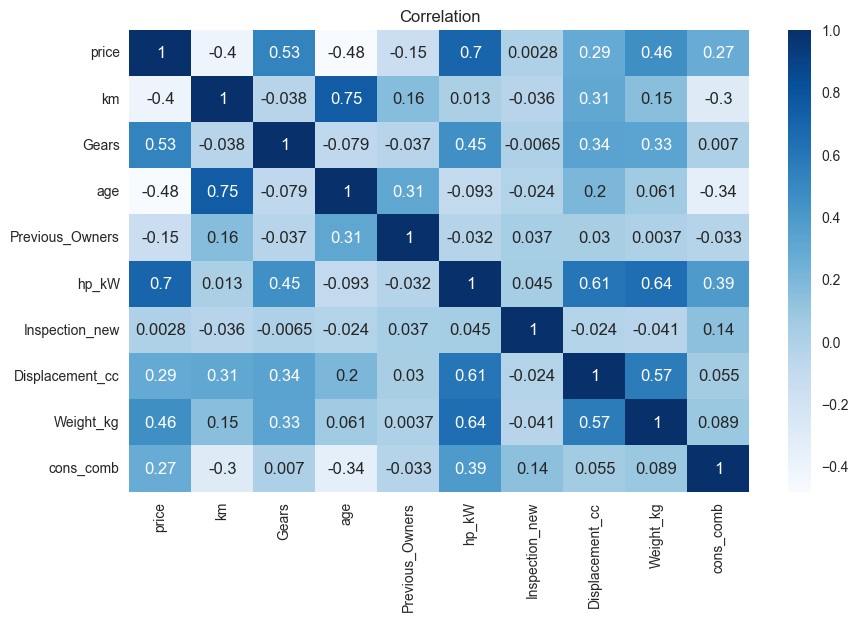

In [268]:
sns.heatmap( df_numeric.corr(),annot=True, cmap="Blues")
plt.title("Correlation");

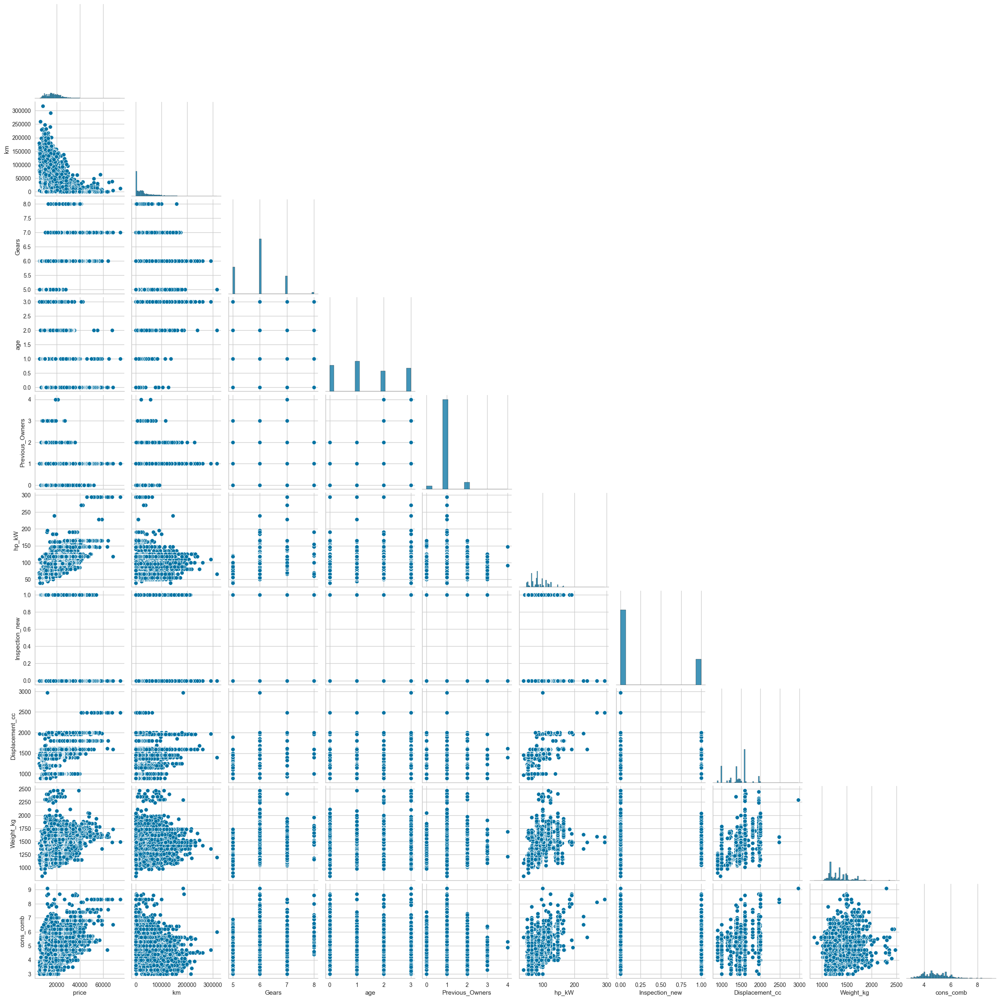

In [269]:
sns.pairplot(df, corner=True);

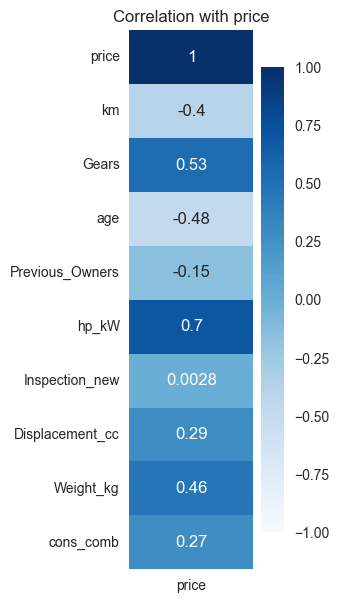

In [275]:
def plot_target_correlation_heatmap(df, target_variable):
   
    df_numeric = df.select_dtypes(include=[np.number])
    df_corr_target = df_numeric.corr()
    
    plt.figure(figsize=(2, 7))
    sns.heatmap(df_corr_target[[target_variable]], annot=True, vmin=-1, vmax=1, cmap="Blues")
    plt.title(f'Correlation with {target_variable}')
    plt.show()
plot_target_correlation_heatmap(df, 'price')

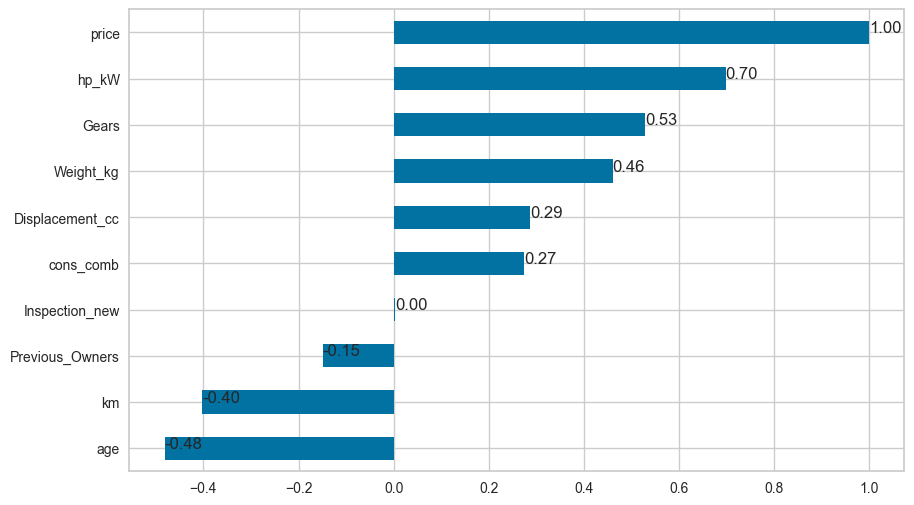

In [277]:
corr_values =  df_numeric = df.select_dtypes(include=[np.number]).corr()["price"].sort_values()
ax = corr_values.plot.barh()
for index, value in enumerate(corr_values):
    plt.text(value, index, "{:.2f}".format(value))

plt.show()

## Multicollinearity control

In [349]:
 df_numeric = df.select_dtypes(include=[np.number])
df_numeric.corr()[(df_numeric.corr()>= 0.9) & (df_numeric.corr() < 1)].any().any()

False

In [350]:
df_numeric.corr()[(df_numeric.corr()<= -0.9) & (df_numeric.corr() > -1)].any().any()

False

NOTE: The any() function is used twice. The first any() checks along the columns and returns whether there are any True values. The second any() checks these results along the rows. This checks if there are any negative correlation values between -0.9 and -1 in the correlation matrix.

In [280]:
def color_correlation1(val):
    """
    Takes a scalar and returns a string with
    the css property in a variety of color scales 
    for different correlations.
    """
    if val >= 0.6 and val < 0.99999 or val <= -0.6 and val > -0.99999:
        color = 'red'
    elif val < 0.6 and val >= 0.3 or val > -0.6 and val <= -0.3:
        color = 'blue'
    elif val == 1:
        color = 'green'    
    else:
        color = 'black'
    return 'color: %s' % color

numeric_df = df.select_dtypes(include=[np.number])

numeric_df.corr().style.applymap(color_correlation1)

,price,km,Gears,age,Previous_Owners,hp_kW,Inspection_new,Displacement_cc,Weight_kg,cons_comb
price,1.000000,-0.402383,0.528127,-0.481424,-0.148628,0.698043,0.002771,0.287021,0.460265,0.273561
km,-0.402383,1.000000,-0.038145,0.748734,0.158775,0.013365,-0.036472,0.305740,0.152797,-0.295296
Gears,0.528127,-0.038145,1.000000,-0.079296,-0.036679,0.451228,-0.006482,0.337764,0.332289,0.006956
age,-0.481424,0.748734,-0.079296,1.000000,0.314147,-0.092952,-0.023629,0.197629,0.061158,-0.339086
Previous_Owners,-0.148628,0.158775,-0.036679,0.314147,1.000000,-0.031628,0.037223,0.030033,0.003690,-0.033281
hp_kW,0.698043,0.013365,0.451228,-0.092952,-0.031628,1.000000,0.044698,0.605772,0.641306,0.391021
Inspection_new,0.002771,-0.036472,-0.006482,-0.023629,0.037223,0.044698,1.000000,-0.023916,-0.040937,0.141964
Displacement_cc,0.287021,0.305740,0.337764,0.197629,0.030033,0.605772,-0.023916,1.000000,0.566900,0.055187
Weight_kg,0.460265,0.152797,0.332289,0.061158,0.003690,0.641306,-0.040937,0.566900,1.000000,0.088582
cons_comb,0.273561,-0.295296,0.006956,-0.339086,-0.033281,0.391021,0.141964,0.055187,0.088582,1.000000


In [281]:
def plot_high_correlation_features(df, target_variable, threshold=0.40):

    numeric_df = df.select_dtypes(include=[float, int])

    corr_matrix = numeric_df.corr()

    high_corr_features = corr_matrix[target_variable][corr_matrix[target_variable].abs() > threshold].index.tolist()

    high_corr_features.remove(target_variable)

    for feature in high_corr_features:
        sns.jointplot(y=df[target_variable], x=df[feature], kind='reg')
        plt.title(f'Correlation with {target_variable}: {feature}')
        plt.show()


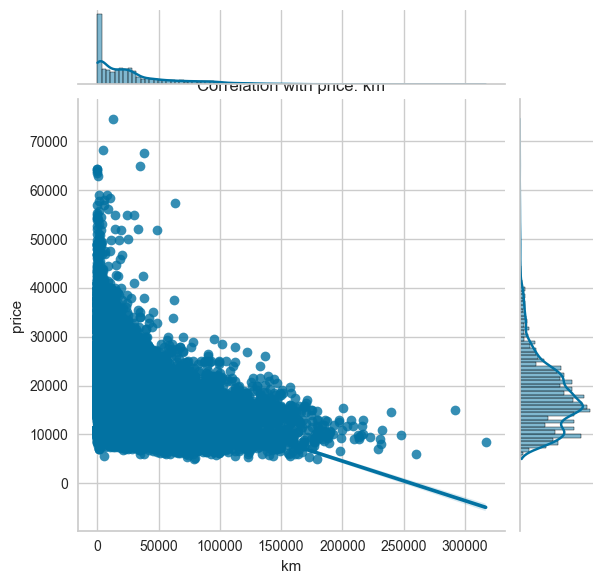

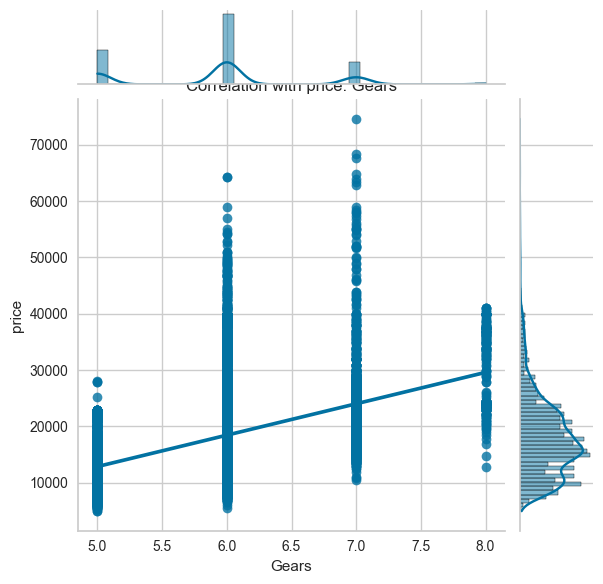

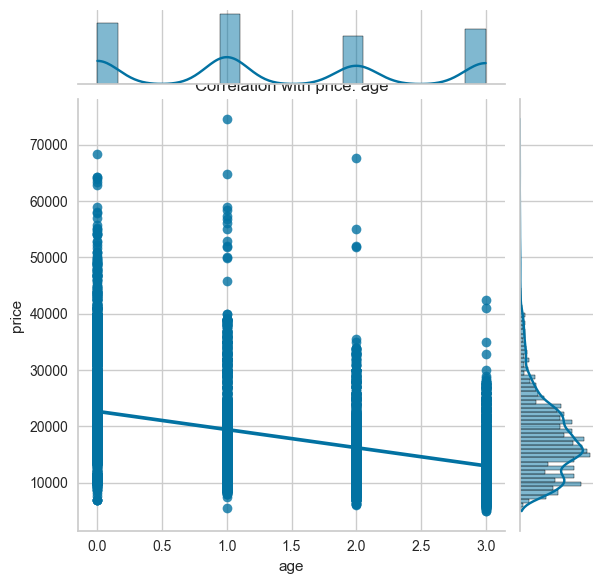

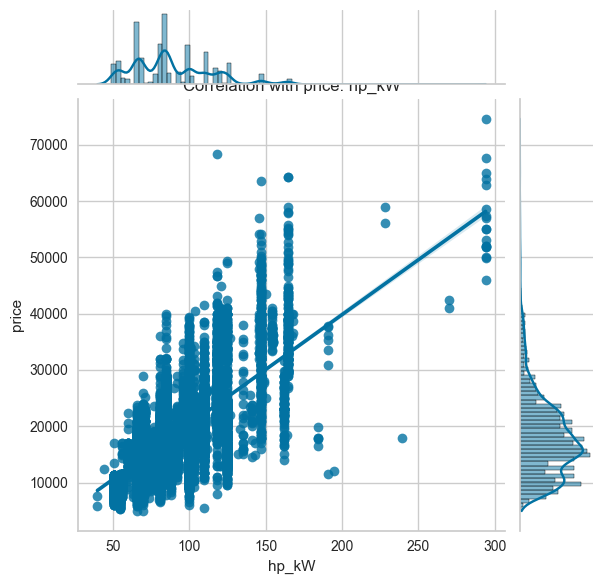

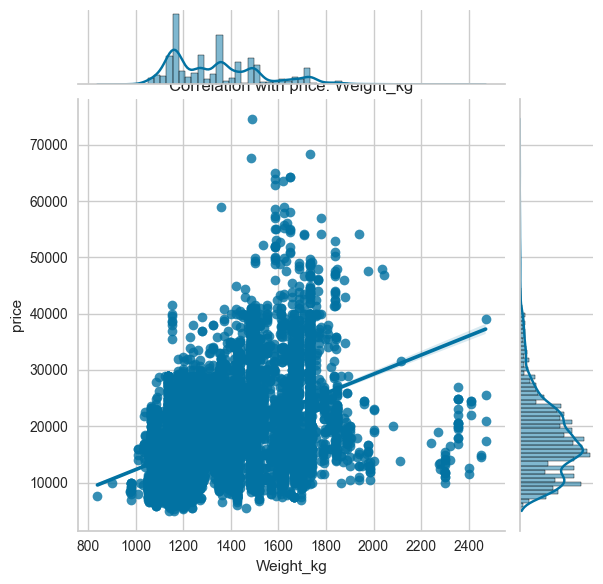

In [282]:
target_variable = 'price'
plot_high_correlation_features(df, target_variable)

In [283]:
num_cols= df.select_dtypes('number').columns

skew_limit = 0.75               # define a limit above which we will log transform
skew_vals = df[num_cols].skew()


# Showing the skewed columns
skew_cols = (skew_vals
             .sort_values(ascending=False)
             .to_frame()
             .rename(columns={0:'Skew'})
             .query('abs(Skew) > {}'.format(skew_limit)))
skew_cols

,Skew
km,1.651
hp_kW,1.330
price,1.269
Inspection_new,1.116
Previous_Owners,1.103
Weight_kg,1.069


<a id="encoding"></a>
# <font color= #FFFFFF> <b> Encoding </b><font color= #FFFFFF>

In [577]:
selected_columns = ["Comfort_Convenience", "Entertainment_Media", "Extras", "Safety_Security"]
df_selected = df[selected_columns]
df_selected.head()

,Comfort_Convenience,Entertainment_Media,Extras,Safety_Security
0,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Catalytic Converter,Voice Control","ABS,Central door lock,Daytime running lights,D..."
1,"Air conditioning,Automatic climate control,Hil...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Sport seats,Sport suspension,Voic...","ABS,Central door lock,Central door lock with r..."
2,"Air conditioning,Cruise control,Electrical sid...","MP3,On-board computer","Alloy wheels,Voice Control","ABS,Central door lock,Daytime running lights,D..."
3,"Air suspension,Armrest,Auxiliary heating,Elect...","Bluetooth,CD player,Hands-free equipment,MP3,O...","Alloy wheels,Sport seats,Voice Control","ABS,Alarm system,Central door lock with remote..."
4,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Hands-free equipment,MP3,O...","Alloy wheels,Sport package,Sport suspension,Vo...","ABS,Central door lock,Driver-side airbag,Elect..."


In [578]:
df = df.join(df["Comfort_Convenience"].str.get_dummies(sep = ",").add_prefix("cc_"))
df = df.join(df["Entertainment_Media"].str.get_dummies(sep = ",").add_prefix("em_"))
df = df.join(df["Extras"].str.get_dummies(sep = ",").add_prefix("ex_"))
df = df.join(df["Safety_Security"].str.get_dummies(sep = ",").add_prefix("ss_"))

In [579]:
df.drop(["Comfort_Convenience","Entertainment_Media","Extras","Safety_Security"], axis=1, inplace=True)

In [580]:
df = pd.get_dummies(df, drop_first =True)

In [581]:
bool_columns = df.columns[df.dtypes == 'bool']
df[bool_columns] = df[bool_columns].astype(int)

In [582]:
df.head()

,price,km,Gears,age,Previous_Owners,hp_kW,Inspection_new,Displacement_cc,Weight_kg,cons_comb,cc_Air conditioning,cc_Air suspension,cc_Armrest,cc_Automatic climate control,cc_Auxiliary heating,cc_Cruise control,cc_Electric Starter,cc_Electric tailgate,cc_Electrical side mirrors,cc_Electrically adjustable seats,cc_Electrically heated windshield,cc_Heads-up display,cc_Heated steering wheel,cc_Hill Holder,cc_Keyless central door lock,cc_Leather seats,cc_Leather steering wheel,cc_Light sensor,cc_Lumbar support,cc_Massage seats,cc_Multi-function steering wheel,cc_Navigation system,cc_Panorama roof,cc_Park Distance Control,cc_Parking assist system camera,cc_Parking assist system self-steering,cc_Parking assist system sensors front,cc_Parking assist system sensors rear,cc_Power windows,cc_Rain sensor,cc_Seat heating,cc_Seat ventilation,cc_Split rear seats,cc_Start-stop system,cc_Sunroof,cc_Tinted windows,cc_Wind deflector,cc_Windshield,em_Bluetooth,em_CD player,em_Digital radio,em_Hands-free equipment,em_MP3,em_On-board computer,em_Radio,em_Sound system,em_Television,em_USB,ex_Alloy wheels,ex_Cab or rented Car,ex_Catalytic Converter,ex_Handicapped enabled,ex_Right hand drive,ex_Roof rack,ex_Shift paddles,ex_Ski bag,ex_Sliding door,ex_Sport package,ex_Sport seats,ex_Sport suspension,ex_Touch screen,ex_Trailer hitch,ex_Tuned car,ex_Voice Control,ex_Winter tyres,ss_ABS,ss_Adaptive Cruise Control,ss_Adaptive headlights,ss_Alarm system,ss_Blind spot monitor,ss_Central door lock,ss_Central door lock with remote control,ss_Daytime running lights,ss_Driver drowsiness detection,ss_Driver-side airbag,ss_Electronic stability control,ss_Emergency brake assistant,ss_Emergency system,ss_Fog lights,ss_Head airbag,ss_Immobilizer,ss_Isofix,ss_LED Daytime Running Lights,ss_LED Headlights,ss_Lane departure warning system,ss_Night view assist,ss_Passenger-side airbag,ss_Power steering,ss_Rear airbag,ss_Side airbag,ss_Tire pressure monitoring system,ss_Traction control,ss_Traffic sign recognition,ss_Xenon headlights,make_model_Audi A3,make_model_Opel Astra,make_model_Opel Corsa,make_model_Opel Insignia,make_model_Renault Clio,make_model_Renault Duster,make_model_Renault Espace,body_type_Convertible,body_type_Coupe,body_type_Off-Road,body_type_Sedans,body_type_Station wagon,body_type_Transporter,body_type_Van,vat_VAT deductible,Type_Employee's car,Type_New,Type_Pre-registered,Type_Used,Fuel_Diesel,Fuel_Electric,Fuel_LPG/CNG,Paint_Type_Perl effect,Paint_Type_Uni/basic,Upholstery_type_Part/Full Leather,Gearing_Type_Manual,Gearing_Type_Semi-automatic,Drive_chain_front,Drive_chain_rear
0,15770,56013.000,7.000,3.000,2.000,66.000,1,1422.000,1220.000,3.800,1,0,1,1,0,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,1,0,1,0,0,0,1,1,1,1,0,0,1,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,1,1,0,0,1,0,1,1,0,0,0,0,1,1,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0
1,14500,80000.000,7.000,2.000,1.000,141.000,0,1798.000,1255.000,5.600,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,1,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,1,1,1,0,1,1,0,0,0,1,1,1,0,0,0,0,1,1,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,14640,83450.000,7.000,3.000,1.000,85.000,0,1598.000,1135.000,3.800,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,1,0,1,0,0,1,1,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,1,1,0,0,0,0,1,1,0,0,0,0,1,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0
3,14500,73000.000,6.000,3.000,1.000,66.000,0,1422.000,1195.000,3.800,0,1,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,1,1,0,1,1,0,0,0,0,0,0,1,1,1,0,1,1,0,0,0,0,1,1,0,1,1,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,1,1,1,0,1,0,1,1,1,0,0,0,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0
4,16790,16200.000,7.000,3.000,1.000,66.000,1,1422.000,1135.000,4.100,1,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0

In [583]:
df.shape

(14241, 133)

In [584]:
df.isnull().any().any()

False

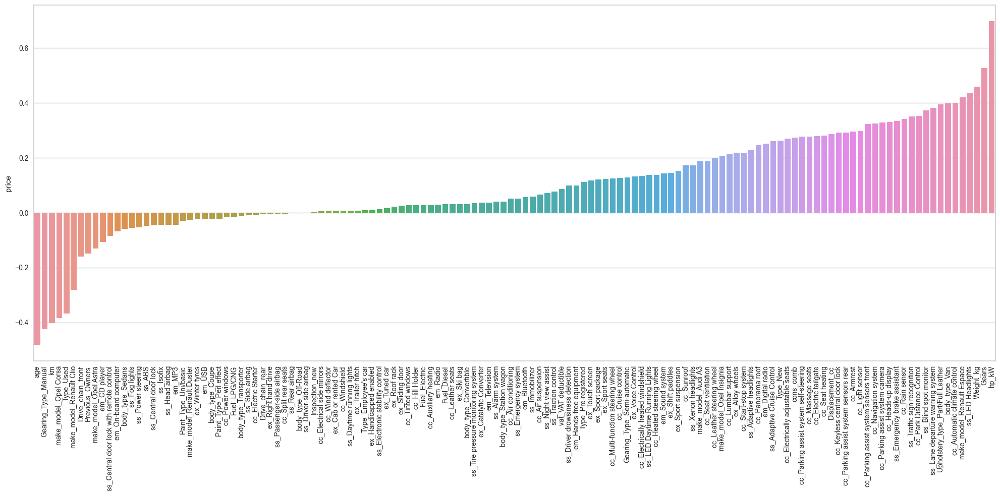

In [300]:
corr_by_price = df.corr()["price"].sort_values()[:-1]
plt.figure(figsize = (20,10))
sns.barplot(x = corr_by_price.index, y = corr_by_price)
plt.xticks(rotation=90)
plt.tight_layout();

<a id="feature-selection"></a>
# <font color= #FFFFFF> <b> Feature Selection (ANOVA) </b><font color= #FFFFFF>

**Apply ANOVA Test**
- Apply the ANOVA test to determine the effect of each feature in the dataset on the target variable (price).

**Identify Successful and Failed Features**
- Determine successful and failed features based on the ANOVA test. Features with a p-value less than 0.05 are marked as 'successful', while those with a p-value greater than 0.05 are marked as 'failed'.

**Present Results Visually**
- Present the ANOVA test results visually by formatting them in HTML with color coding.

**Remove Failed Features**
- Remove the features marked as 'failed' based on the ANOVA test results from the dataset.

In [357]:
from scipy.stats import f_oneway
from IPython.display import display, HTML

# ANOVA test fonksiyonu
def feature_anova_test(df, target):
    results = {}
    features = df.columns.drop(target)
    for feature in features:
        unique_values = df[feature].unique()
        if len(unique_values) > 1:
            groups = [df[df[feature] == value][target] for value in unique_values]
            anova_result = f_oneway(*groups)
            if anova_result.pvalue < 0.05:
                results[feature] = 'successful'
            else:
                results[feature] = 'failed'
        else:
            results[feature] = 'Başarısız (Tek değerli)'
    return results

In [358]:

target = 'price'
results = feature_anova_test(df, target)


html_result = ""
for feature, result in results.items():
    if result == 'successful':
        html_result += f'<p style="color:red;">{feature}: {result}</p>'
    else:
        html_result += f'<p>{feature}: {result}</p>'

display(HTML(html_result))


In [359]:
# Identifying characteristics that fail
false_features = [feature for feature, result in results.items() if 'failed' in result]

# Remove failed features from the data set
df = df.drop(columns=false_features)

# Display a summary of the new data set
df.head()


,price,km,Gears,age,Previous_Owners,hp_kW,Displacement_cc,Weight_kg,cons_comb,cc_Air conditioning,cc_Air suspension,cc_Armrest,cc_Automatic climate control,cc_Auxiliary heating,cc_Cruise control,cc_Electric tailgate,cc_Electrically adjustable seats,cc_Electrically heated windshield,cc_Heads-up display,cc_Heated steering wheel,cc_Hill Holder,cc_Keyless central door lock,cc_Leather seats,cc_Leather steering wheel,cc_Light sensor,cc_Lumbar support,cc_Massage seats,cc_Multi-function steering wheel,cc_Navigation system,cc_Panorama roof,cc_Park Distance Control,cc_Parking assist system camera,cc_Parking assist system self-steering,cc_Parking assist system sensors front,cc_Parking assist system sensors rear,cc_Rain sensor,cc_Seat heating,cc_Seat ventilation,cc_Start-stop system,cc_Sunroof,cc_Tinted windows,em_Bluetooth,em_CD player,em_Digital radio,em_Hands-free equipment,em_MP3,em_On-board computer,em_Radio,em_Sound system,em_Television,em_USB,ex_Alloy wheels,ex_Catalytic Converter,ex_Roof rack,ex_Shift paddles,ex_Ski bag,ex_Sliding door,ex_Sport package,ex_Sport seats,ex_Sport suspension,ex_Touch screen,ex_Tuned car,ex_Voice Control,ex_Winter tyres,ss_ABS,ss_Adaptive Cruise Control,ss_Adaptive headlights,ss_Alarm system,ss_Blind spot monitor,ss_Central door lock,ss_Central door lock with remote control,ss_Driver drowsiness detection,ss_Emergency brake assistant,ss_Emergency system,ss_Fog lights,ss_Head airbag,ss_Immobilizer,ss_Isofix,ss_LED Daytime Running Lights,ss_LED Headlights,ss_Lane departure warning system,ss_Night view assist,ss_Power steering,ss_Tire pressure monitoring system,ss_Traction control,ss_Traffic sign recognition,ss_Xenon headlights,make_model_Audi A3,make_model_Opel Astra,make_model_Opel Corsa,make_model_Opel Insignia,make_model_Renault Clio,make_model_Renault Duster,make_model_Renault Espace,body_type_Convertible,body_type_Coupe,body_type_Sedans,body_type_Station wagon,body_type_Van,vat_VAT deductible,Type_New,Type_Pre-registered,Type_Used,Fuel_Diesel,Fuel_Electric,Paint_Type_Perl effect,Paint_Type_Uni/basic,Upholstery_type_Part/Full Leather,Gearing_Type_Manual,Gearing_Type_Semi-automatic,Drive_chain_front
0,15770,56013.000,7.000,3.000,2.000,66.000,1422.000,1220.000,3.800,1,0,1,1,0,1,0,0,0,0,0,1,0,0,1,1,0,0,1,1,0,1,0,0,0,1,1,1,0,1,0,0,1,0,0,1,0,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,1
1,14500,80000.000,7.000,2.000,1.000,141.000,1798.000,1255.000,5.600,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,1,0,1,1,1,0,0,1,0,0,0,0,0,0,1,1,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,1,1,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1
2,14640,83450.000,7.000,3.000,1.000,85.000,1598.000,1135.000,3.800,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,1,0,0,1,1,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,1
3,14500,73000.000,6.000,3.000,1.000,66.000,1422.000,1195.000,3.800,0,1,1,0,1,0,0,0,0,1,0,1,0,0,1,1,1,0,1,1,0,0,0,0,0,0,1,1,0,1,0,0,1,1,0,1,1,1,1,1,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,1,0,1,0,1,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,1
4,16790,16200.000,7.000,3.000,1.000,66.000,1422.000,1135.000,4.100,1,0,1,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,1,1,0,0,1,0,0,1,1,0,1,1,1,1,0,0,1,1,0,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,1


In [360]:
df.shape

(14242, 111)

In [585]:
df1 = df.copy()

<a id="models"></a>
# <font color= #FF0000> <b>Models</b><font color= #FF0000>

## Train | Test Split

In [586]:
X= df.drop(columns="price")
y= df.price

In [587]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

In [588]:
print("X Train features shape: {}\ny Train features shape: {}\nX Test features shape: {}\ny Test features shape: {}" 
      .format(X_train.shape, y_train.shape, X_test.shape, y_test.shape))

X Train features shape: (12816, 132)
y Train features shape: (12816,)
X Test features shape: (1425, 132)
y Test features shape: (1425,)


<a id="linear-regression-model"></a>
# <font color= #FFFFFF> <b>Linear Regression Model</b><font color= #FFFFFF>

In [589]:

def train_val(model, X_train, y_train, X_test, y_test,i):
    
    y_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)
    
    scores = {
    i+"_train": {
    "R2" : r2_score(y_train, y_train_pred),
    "mae" : mean_absolute_error(y_train, y_train_pred),
    "mse" : mean_squared_error(y_train, y_train_pred),                          
    "rmse" : np.sqrt(mean_squared_error(y_train, y_train_pred))},
    
    i+"_test": {
    "R2" : r2_score(y_test, y_pred),
    "mae" : mean_absolute_error(y_test, y_pred),
    "mse" : mean_squared_error(y_test, y_pred),
    "rmse" : np.sqrt(mean_squared_error(y_test, y_pred))}
               }
    
    return pd.DataFrame(scores)

In [590]:
lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression()

In [591]:
lm_scores = train_val(lm, X_train, y_train, X_test, y_test, "linear")
lm_scores

,linear_train,linear_test
R2,0.890,0.882
mae,1711.606,1749.899
mse,6076289.734,6475631.335
rmse,2465.013,2544.726


In [592]:
y_pred = lm.predict(X_test)
y_train_pred = lm.predict(X_train)

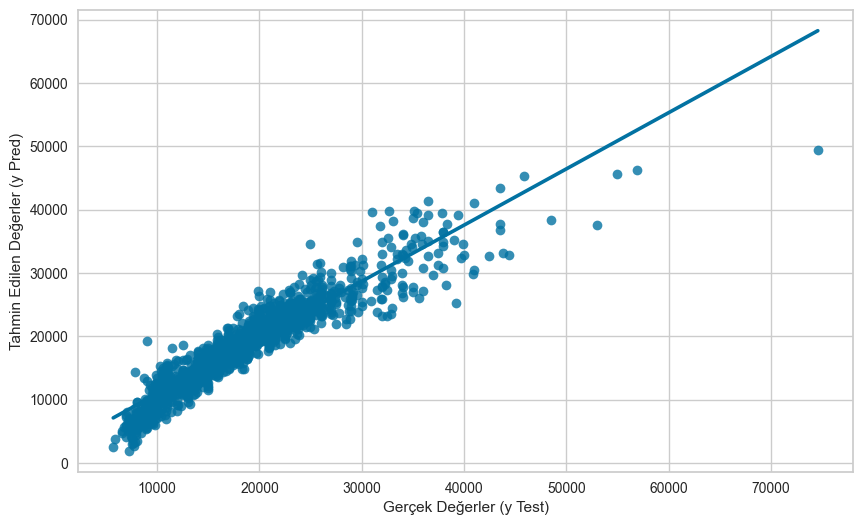

In [593]:
data = pd.DataFrame({'y_test': y_test, 'y_pred': y_pred})

sns.regplot(data=data, x='y_test', y='y_pred', ci=None)
plt.xlabel('Gerçek Değerler (y Test)')
plt.ylabel('Tahmin Edilen Değerler (y Pred)')
plt.show()

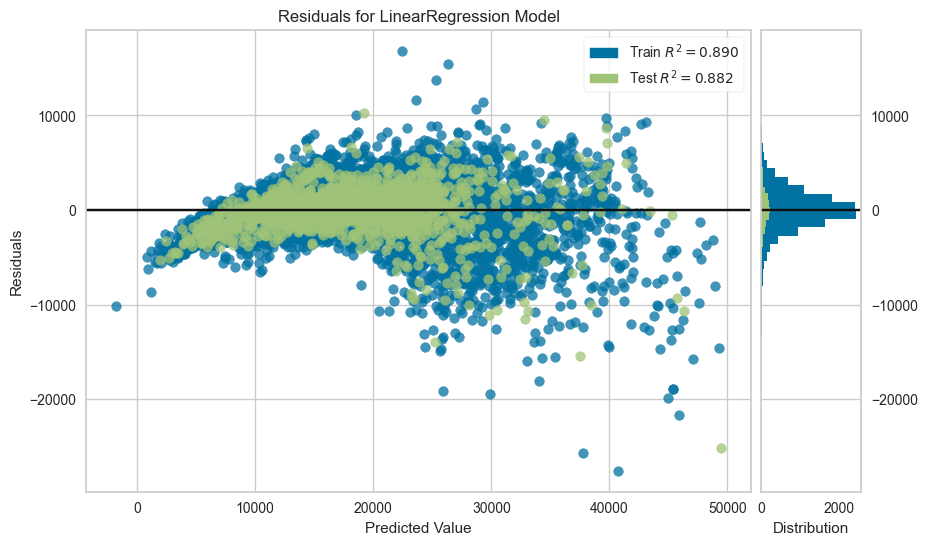

In [594]:
model = LinearRegression()
visualizer = ResidualsPlot(model)

visualizer.fit(X_train, y_train) 
visualizer.score(X_test, y_test)  
visualizer.show();   

## Cross Validate

In [595]:
model = LinearRegression()
scores = cross_validate(model, X_train, y_train, 
                        scoring = ['r2', 'neg_mean_absolute_error','neg_mean_squared_error', \
                                    'neg_root_mean_squared_error'], cv = 10, return_train_score=True)

In [596]:
pd.DataFrame(scores, index = range(1, 11))

,fit_time,score_time,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
1,0.226,0.008,0.883,0.890,-1707.791,-1715.864,-6206255.518,-6069973.882,-2491.236,-2463.732
2,0.131,0.007,0.893,0.889,-1696.165,-1720.673,-5756868.677,-6123306.864,-2399.348,-2474.532
3,0.121,0.016,0.881,0.890,-1779.739,-1699.201,-7341537.559,-5957034.156,-2709.527,-2440.704
4,0.177,0.008,0.904,0.888,-1664.172,-1717.960,-5332574.171,-6167527.171,-2309.237,-2483.451
5,0.222,0.004,0.883,0.890,-1689.797,-1724.116,-5378843.826,-6163936.834,-2319.233,-2482.728
6,0.087,0.002,0.882,0.890,-1743.394,-1710.453,-6125082.232,-6080730.089,-2474.890,-2465.914
7,0.069,0.000,0.880,0.890,-1784.180,-1700.557,-7096150.039,-5983427.046,-2663.860,-2446.104
8,0.087,0.010,0.881,0.890,-1772.349,-1705.812,-6448472.761,-6044794.508,-2539.384,-2458.616
9,0.179,0.000,0.877,0.891,-1812.474,-1696.849,-7195311.533,-5960957.734,-2682.408,-2441.507
10,0.196,0.009,0.894,0.889,-1673.554,-1717.391,-5847946.352,-6111405.476,-2418.253,-2472.126


In [597]:
scores = pd.DataFrame(scores, index=range(1,11))
scores.iloc[:, 2:].mean()

test_r2                                    0.886
train_r2                                   0.890
test_neg_mean_absolute_error           -1732.361
train_neg_mean_absolute_error          -1710.887
test_neg_mean_squared_error         -6272904.267
train_neg_mean_squared_error        -6066309.376
test_neg_root_mean_squared_error       -2500.738
train_neg_root_mean_squared_error      -2462.941
dtype: float64

In [598]:
lm_scores

,linear_train,linear_test
R2,0.890,0.882
mae,1711.606,1749.899
mse,6076289.734,6475631.335
rmse,2465.013,2544.726


In [599]:
y_pred = lm.predict(X_test)
y_train_pred = lm.predict(X_train)

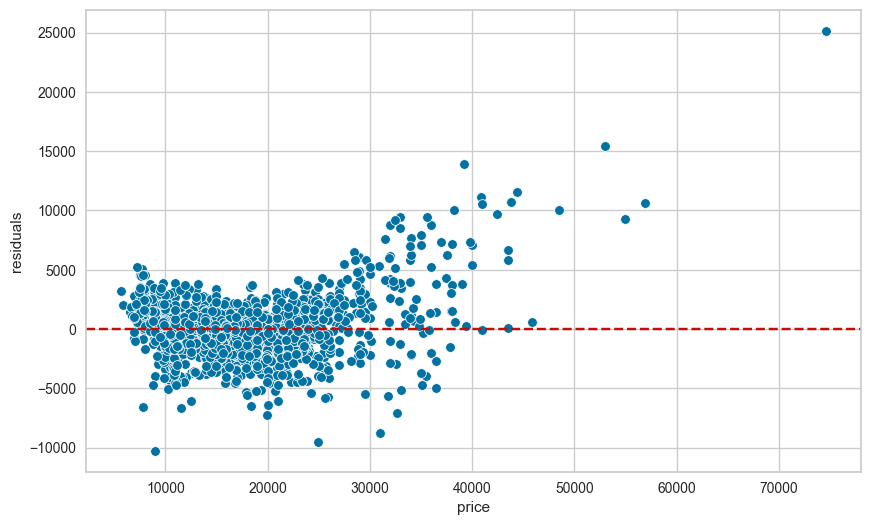

In [600]:
residuals = y_test-y_pred

plt.figure(figsize = (10,6))
sns.scatterplot(x = y_test, y = residuals) #-residuals
plt.axhline(y = 0, color ="r", linestyle = "--")
plt.ylabel("residuals");

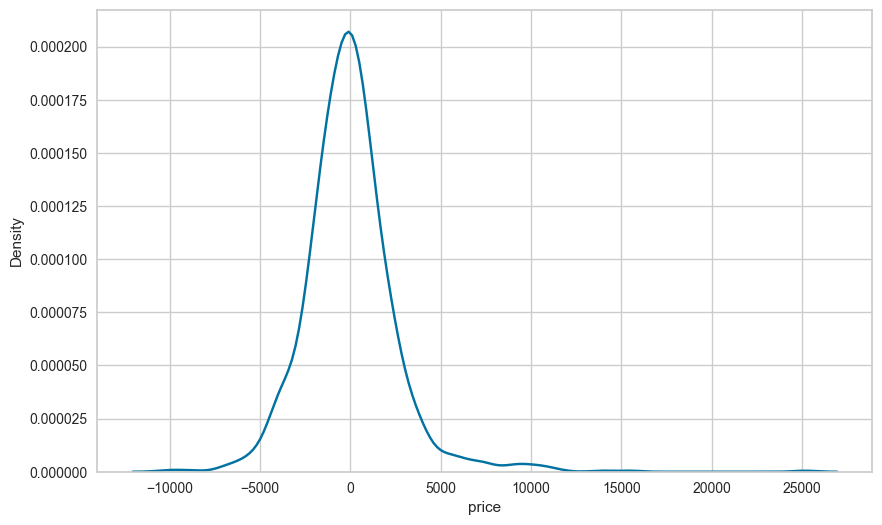

In [601]:
sns.kdeplot(residuals);

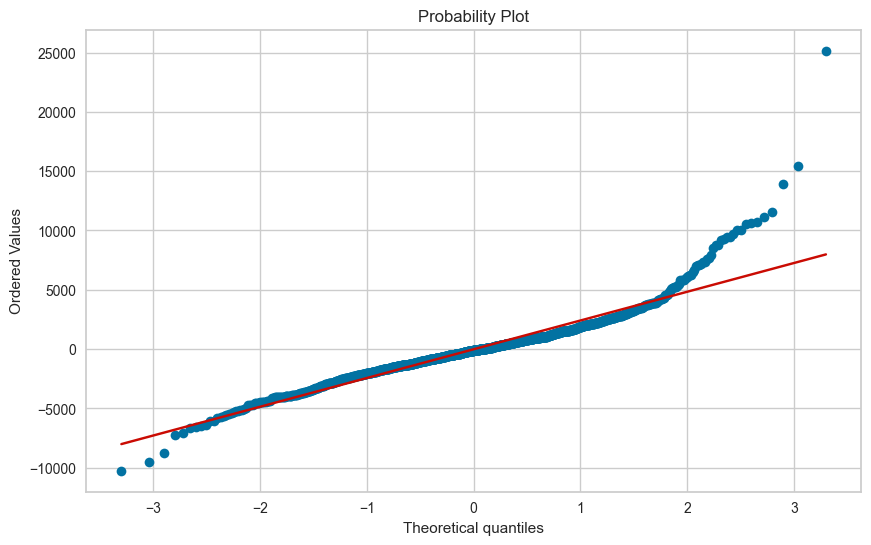

In [602]:
# pip install scipy
import scipy.stats as stats

stats.probplot(residuals, dist ="norm", plot =plt);

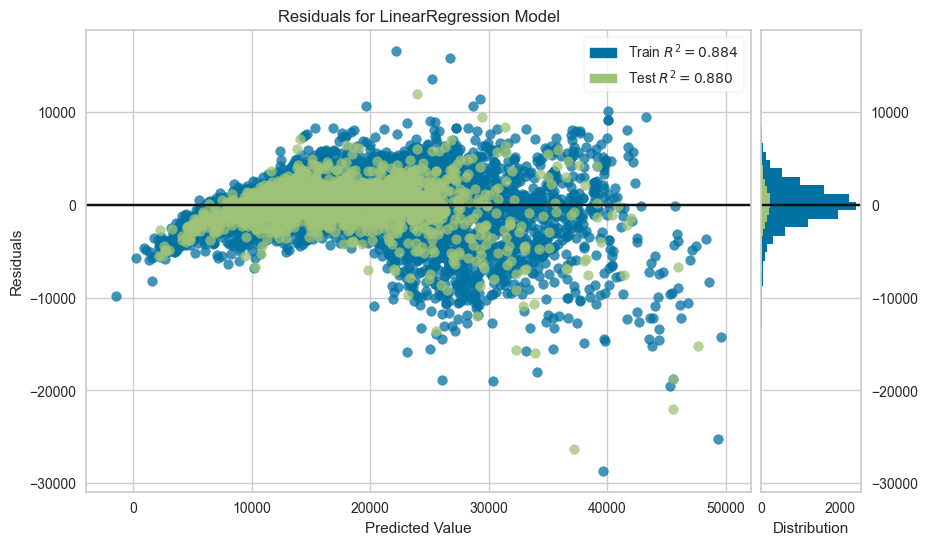

In [379]:
from yellowbrick.regressor import ResidualsPlot


model = LinearRegression()
visualizer = ResidualsPlot(model)

visualizer.fit(X_train, y_train) 
visualizer.score(X_test, y_test)  
visualizer.show();                

<a id="ridge-regression-model"></a>
# <font color= #FFFFFF> <b>Ridge Regression Model</b><font color= #FFFFFF>

In [603]:
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [604]:
ridge_model = Ridge(alpha=1, random_state=42)
ridge_model.fit(X_train_scaled, y_train)

Ridge(alpha=1, random_state=42)

In [605]:
train_val(ridge_model, X_train_scaled, y_train, X_test_scaled, y_test, "ridge")


,ridge_train,ridge_test
R2,0.890,0.883
mae,1710.243,1746.558
mse,6080649.862,6458476.736
rmse,2465.897,2541.353


## RidgeCV

In [606]:
model = Ridge(alpha=1)
scores = cross_validate(model, X_train_scaled, y_train,
                    scoring=['r2', 'neg_mean_absolute_error','neg_mean_squared_error','neg_root_mean_squared_error'], 
                        cv=10, return_train_score=True)

scores = pd.DataFrame(scores, index = range(1, 11))
scores.iloc[:,2:].mean()

test_r2                                    0.886
train_r2                                   0.890
test_neg_mean_absolute_error           -1730.586
train_neg_mean_absolute_error          -1709.429
test_neg_mean_squared_error         -6272840.882
train_neg_mean_squared_error        -6071625.163
test_neg_root_mean_squared_error       -2500.666
train_neg_root_mean_squared_error      -2464.020
dtype: float64

## RidgeGridSearchCV

In [607]:
alpha_space = np.linspace(0.01, 1, 100)
alpha_space

array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33,
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99,
       1.  ])

In [608]:
ridge_grid_model = Ridge()
param_grid = {"alpha":alpha_space}

In [609]:
ridge_grid_model = GridSearchCV(estimator = ridge_model, param_grid = param_grid, scoring = 'neg_root_mean_squared_error',
                         cv =10, n_jobs = -1, return_train_score=True)


In [610]:
ridge_grid_model.fit(X_train_scaled, y_train)

GridSearchCV(cv=10, estimator=Ridge(alpha=1, random_state=42), n_jobs=-1,
             param_grid={'alpha': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33,
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99,
       1.  ])},
             return_train_score=True, scoring='neg_root_mean_squared_error')

In [611]:
ridge_grid_model.best_params_

{'alpha': 0.47000000000000003}

In [612]:
ridge_grid_model.best_index_

46

In [613]:
pd.DataFrame(ridge_grid_model.cv_results_).loc[46, ["mean_test_score", "mean_train_score"]]

mean_test_score    -2500.342
mean_train_score   -2463.217
Name: 46, dtype: object

In [614]:
ridge_grid_model.best_score_

-2500.34224314864

In [615]:
ridge_grid = train_val(ridge_model, X_train_scaled, y_train, X_test_scaled, y_test, "ridge_grid")
ridge_grid

,ridge_grid_train,ridge_grid_test
R2,0.890,0.883
mae,1710.243,1746.558
mse,6080649.862,6458476.736
rmse,2465.897,2541.353


In [616]:
result = pd.concat([lm_scores, ridge_grid], axis=1)
result

,linear_train,linear_test,ridge_grid_train,ridge_grid_test
R2,0.890,0.882,0.890,0.883
mae,1711.606,1749.899,1710.243,1746.558
mse,6076289.734,6475631.335,6080649.862,6458476.736
rmse,2465.013,2544.726,2465.897,2541.353


<a id="lasso-regression-model"></a>
# <font color= #FFFFFF> <b>Lasso Regression Model</b><font color= #FFFFFF>

In [617]:
lasso_model = Lasso(alpha=1)

lasso_model = lasso_model.fit(X_train_scaled, y_train)

#predict
y_pred = lasso_model.predict(X_test_scaled)
y_train_pred = lasso_model.predict(X_train_scaled)


In [618]:
train_val(lasso_model, X_train_scaled, y_train, X_test_scaled, y_test, "lasso")

,lasso_train,lasso_test
R2,0.889,0.883
mae,1712.690,1746.372
mse,6094180.755,6432564.858
rmse,2468.639,2536.250


### Lasso GridSearchCV

In [619]:
lasso_model = Lasso()
param_grid = {"alpha":alpha_space}

In [620]:
grid_lasso = GridSearchCV(estimator = lasso_model, param_grid = param_grid, scoring = 'neg_root_mean_squared_error',
                         cv =5, n_jobs = -1, return_train_score=True)

In [621]:
grid_lasso.fit(X_train_scaled, y_train)

GridSearchCV(cv=5, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33,
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99,
       1.  ])},
             return_train_score=True, scoring='neg_root_mean_squared_error')

In [622]:
grid_lasso.best_params_

# en iyi skoru dönderen alpha hyper parametresi 0.01 miş.

{'alpha': 0.6}

In [623]:
grid_lasso.best_index_

# en iyi scorun alındığı df indexini döndürür.

59

In [625]:
pd.DataFrame(grid_lasso.cv_results_).loc[59, ["mean_test_score", "mean_train_score"]]

# Overfiting olmadığını teyit ediyoruz.

mean_test_score    -2505.278
mean_train_score   -2461.809
Name: 59, dtype: object

In [626]:
grid_lasso.best_score_

# validation setinin scorunu alıyoruz.

-2505.278348475137

In [627]:
y_pred = grid_lasso.predict(X_test_scaled)
y_train_pred = grid_lasso.predict(X_train_scaled)

In [628]:
lasso = train_val(grid_lasso, X_train_scaled, y_train, X_test_scaled, y_test, "grid_lasso")
lasso


,grid_lasso_train,grid_lasso_test
R2,0.890,0.883
mae,1711.806,1747.751
mse,6083595.374,6444823.533
rmse,2466.495,2538.666


In [629]:
result = pd.concat([result, lasso], axis=1)
result

,linear_train,linear_test,ridge_grid_train,ridge_grid_test,grid_lasso_train,grid_lasso_test
R2,0.890,0.882,0.890,0.883,0.890,0.883
mae,1711.606,1749.899,1710.243,1746.558,1711.806,1747.751
mse,6076289.734,6475631.335,6080649.862,6458476.736,6083595.374,6444823.533
rmse,2465.013,2544.726,2465.897,2541.353,2466.495,2538.666


<a id="elastic-net-regression-model"></a>
# <font color= #FFFFFF> <b>Elastic-Net Regression Model</b><font color= #FFFFFF>

In [630]:
elastic_model = ElasticNet(alpha = 1, l1_ratio = 0.5, random_state = 42)
elastic_model.fit(X_train_scaled, y_train)

ElasticNet(alpha=1, random_state=42)

In [631]:
es = train_val(elastic_model, X_train_scaled, y_train, X_test_scaled, y_test, "elastic")
es

,elastic_train,elastic_test
R2,0.599,0.592
mae,3382.940,3376.039
mse,22062434.031,22471498.477
rmse,4697.067,4740.411


### For Elastic_net CV with Default alpha = 1 and l1_ratio=0.5

In [632]:
elastic_model = ElasticNet(random_state=42, l1_ratio=0.5)
elastic_model.fit(X_train_scaled,y_train)

ElasticNet(random_state=42)

In [633]:
train_val(elastic_model, X_train_scaled, y_train, X_test_scaled, y_test,"es")

,es_train,es_test
R2,0.599,0.592
mae,3382.940,3376.039
mse,22062434.031,22471498.477
rmse,4697.067,4740.411


### Elastic GridSearchCV

In [634]:
elastic_model = ElasticNet()

In [635]:
param_grid = {'alpha':[1.02, 2,  3, 4, 5, 7, 10, 11],
              'l1_ratio':[.5, .7, .9, .95, .99, 1]}

elastic_grid_model = GridSearchCV(estimator=elastic_model,
                          param_grid=param_grid,
                          scoring='neg_root_mean_squared_error',
                          cv=10,
                          n_jobs = -1)

In [636]:
elastic_grid_model.fit(X_train_scaled,y_train)

GridSearchCV(cv=10, estimator=ElasticNet(), n_jobs=-1,
             param_grid={'alpha': [1.02, 2, 3, 4, 5, 7, 10, 11],
                         'l1_ratio': [0.5, 0.7, 0.9, 0.95, 0.99, 1]},
             scoring='neg_root_mean_squared_error')

In [637]:
elastic_grid_model.best_params_

{'alpha': 1.02, 'l1_ratio': 1}

In [638]:
elastic_grid_model.best_index_

5

In [639]:
elastic_grid_model.best_score_

-2499.1178496460216

In [640]:
gridsearch = train_val(elastic_grid_model,  X_train_scaled, y_train, X_test_scaled, y_test, "ElasticGridSearch")
gridsearch

,ElasticGridSearch_train,ElasticGridSearch_test
R2,0.889,0.883
mae,1712.742,1746.277
mse,6094780.841,6432022.789
rmse,2468.761,2536.143


In [641]:
result = pd.concat([result, gridsearch], axis=1)   
result

,linear_train,linear_test,ridge_grid_train,ridge_grid_test,grid_lasso_train,grid_lasso_test,ElasticGridSearch_train,ElasticGridSearch_test
R2,0.890,0.882,0.890,0.883,0.890,0.883,0.889,0.883
mae,1711.606,1749.899,1710.243,1746.558,1711.806,1747.751,1712.742,1746.277
mse,6076289.734,6475631.335,6080649.862,6458476.736,6083595.374,6444823.533,6094780.841,6432022.789
rmse,2465.013,2544.726,2465.897,2541.353,2466.495,2538.666,2468.761,2536.143


<a id="lasso-regression-model-without-outliers"></a>
# <font color= #FFFFFF> <b>Lasso Regression Model (Without Outliers)</b><font color= #FFFFFF>

In [665]:
df1 = df.copy()

In [666]:
df1 = df1[~(df1.price > 35000)]

In [669]:
X= df1.drop(columns="price")
y= df1.price

In [670]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

In [671]:
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [672]:
lasso_model = Lasso()
param_grid = {"alpha":alpha_space}

In [673]:
grid_lasso_out = GridSearchCV(estimator = lasso_model, param_grid = param_grid, scoring = 'neg_root_mean_squared_error',
                         cv =5, n_jobs = -1, return_train_score=True)

In [649]:
grid_lasso_out.fit(X_train_scaled, y_train)

GridSearchCV(cv=5, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33,
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99,
       1.  ])},
             return_train_score=True, scoring='neg_root_mean_squared_error')

In [650]:
lasso_out = train_val(grid_lasso_out, X_train_scaled, y_train, X_test_scaled, y_test, "grid_lasso_out")
lasso_out


,grid_lasso_out_train,grid_lasso_out_test
R2,0.896,0.910
mae,1421.146,1345.808
mse,3857704.346,3360434.089
rmse,1964.104,1833.149


In [652]:
result = pd.concat([result, lasso_out], axis=1)
result

,linear_train,linear_test,ridge_grid_train,ridge_grid_test,grid_lasso_train,grid_lasso_test,ElasticGridSearch_train,ElasticGridSearch_test,grid_lasso_out_train,grid_lasso_out_test
R2,0.890,0.882,0.890,0.883,0.890,0.883,0.889,0.883,0.896,0.910
mae,1711.606,1749.899,1710.243,1746.558,1711.806,1747.751,1712.742,1746.277,1421.146,1345.808
mse,6076289.734,6475631.335,6080649.862,6458476.736,6083595.374,6444823.533,6094780.841,6432022.789,3857704.346,3360434.089
rmse,2465.013,2544.726,2465.897,2541.353,2466.495,2538.666,2468.761,2536.143,1964.104,1833.149


<a id="feature-importance"></a>
# <font color= #FFFFFF> <b>Feature Importance</b><font color= #FFFFFF> 

According to the Ridge graph, I have identified the most important columns as hp_kW (Horsepower in kilowatts), Fuel, make_model, Displacement_cc, km, and age.

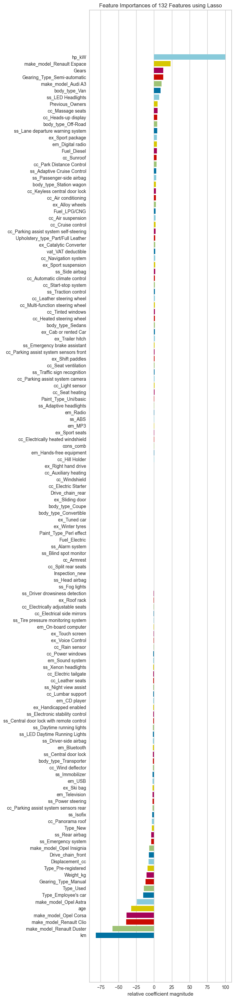

In [654]:
from yellowbrick.model_selection import FeatureImportances
from yellowbrick.features import RadViz

model = Lasso(alpha= 0.6)

viz = FeatureImportances(model, labels=pd.DataFrame(X_train).columns)
visualizer = RadViz(size=(720, 3000))
viz.fit(X_train_scaled, y_train)
viz.show();

# Lasso modeli için en iyi scoru veren alpha=0.01 hyperparametresiyle modeli FeatureImportances
# fonksiyonunun içine veriyoruz.  labels olarak da df'in columns isimlerini veriyoruz.

# lasso üzerinden feature selection yapabiliriz

According to the Lasso graph, I have identified the most important columns as hp_kW (Horsepower in kilowatts), Fuel, make_model, Displacement_cc, km, and age. Both graphs give weight to the same columns.

<a id="customer-regression-model"></a>
# <font color= #FFFFFF> <b>Customer Regression Model</b><font color= #FFFFFF>

In [674]:
# We selected the features that have the most impact on the predictions.
df_new = df0[["make_model", "hp_kW", "km", "age", "Gearing_Type", "price"]]

In [675]:
df_new.head(1)

,make_model,hp_kW,km,age,Gearing_Type,price
0,Audi A1,66.000,56013.000,3.000,Automatic,15770


In [676]:
df_new.drop(index=[2614], inplace=True)
df_new = df_new[~(df_new.price > 35000)]

In [677]:
df_new = pd.get_dummies(df_new, drop_first =True)
bool_columns = df_new.columns[df_new.dtypes == 'bool']
df_new[bool_columns] = df_new[bool_columns].astype(int)

In [679]:
df_new.head(1)

,hp_kW,km,age,price,make_model_Audi A3,make_model_Opel Astra,make_model_Opel Corsa,make_model_Opel Insignia,make_model_Renault Clio,make_model_Renault Duster,make_model_Renault Espace,Gearing_Type_Manual,Gearing_Type_Semi-automatic
0,66.000,56013.000,3.000,15770,0,0,0,0,0,0,0,0,0


In [680]:
X = df_new.drop(columns=["price"])
y = df_new.price

In [682]:
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.1,
                                                    random_state=42)

In [683]:
scaler = MinMaxScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [691]:
lasso_model = Lasso(random_state=42)

param_grid = {'alpha': alpha_space}

lasso_final_model = GridSearchCV(estimator=lasso_model,
                                 param_grid=param_grid,
                                 scoring='neg_root_mean_squared_error',
                                 cv=10,
                                 n_jobs=-1)

In [692]:
lasso_final_model.fit(X_train_scaled, y_train)

GridSearchCV(cv=10, estimator=Lasso(random_state=42), n_jobs=-1,
             param_grid={'alpha': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33,
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99,
       1.  ])},
             scoring='neg_root_mean_squared_error')

In [687]:
final_model = train_val(lasso_final_model, X_train_scaled, y_train, X_test_scaled, y_test, "final")
final_model

,final_train,final_test
R2,0.869,0.876
mae,1604.516,1556.582
mse,4956988.650,4530105.018
rmse,2226.430,2128.404


In [688]:
result = pd.concat([result, final_model], axis=1)   
result

,linear_train,linear_test,ridge_grid_train,ridge_grid_test,grid_lasso_train,grid_lasso_test,ElasticGridSearch_train,ElasticGridSearch_test,grid_lasso_out_train,grid_lasso_out_test,final_train,final_test
R2,0.890,0.882,0.890,0.883,0.890,0.883,0.889,0.883,0.896,0.910,0.869,0.876
mae,1711.606,1749.899,1710.243,1746.558,1711.806,1747.751,1712.742,1746.277,1421.146,1345.808,1604.516,1556.582
mse,6076289.734,6475631.335,6080649.862,6458476.736,6083595.374,6444823.533,6094780.841,6432022.789,3857704.346,3360434.089,4956988.650,4530105.018
rmse,2465.013,2544.726,2465.897,2541.353,2466.495,2538.666,2468.761,2536.143,1964.104,1833.149,2226.430,2128.404


In [693]:
y_pred = lasso_final_model.predict(X_test)
y_train_pred = lasso_final_model.predict(X_train)
residuals = y_test-y_pred

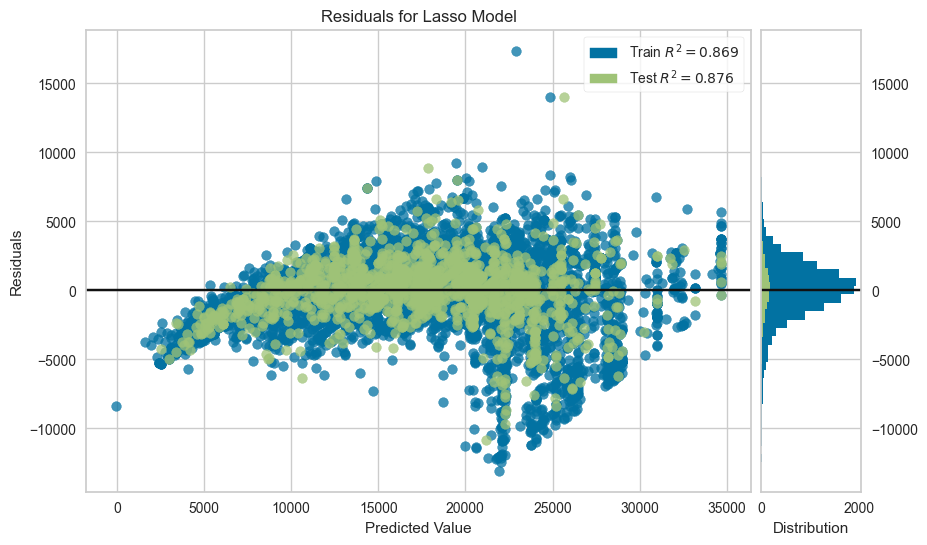

In [696]:
from yellowbrick.regressor import ResidualsPlot


model = Lasso(random_state=42)
visualizer = ResidualsPlot(model)

visualizer.fit(X_train, y_train) 
visualizer.score(X_test, y_test)  
visualizer.show();  

<a id="compare-models-performance"></a>
# <font color= #FFFFFF> <b>Compare Models Performance</b><font color= #FFFFFF>

In [697]:
result

,linear_train,linear_test,ridge_grid_train,ridge_grid_test,grid_lasso_train,grid_lasso_test,ElasticGridSearch_train,ElasticGridSearch_test,grid_lasso_out_train,grid_lasso_out_test,final_train,final_test
R2,0.890,0.882,0.890,0.883,0.890,0.883,0.889,0.883,0.896,0.910,0.869,0.876
mae,1711.606,1749.899,1710.243,1746.558,1711.806,1747.751,1712.742,1746.277,1421.146,1345.808,1604.516,1556.582
mse,6076289.734,6475631.335,6080649.862,6458476.736,6083595.374,6444823.533,6094780.841,6432022.789,3857704.346,3360434.089,4956988.650,4530105.018
rmse,2465.013,2544.726,2465.897,2541.353,2466.495,2538.666,2468.761,2536.143,1964.104,1833.149,2226.430,2128.404


In [698]:
def plot_metrics(result):
    for i, metric in enumerate(result.index):
        plt.figure(i)
        if metric == "R2":
            ascending = False
        else:
            ascending = True
        compare = result.sort_values(by=metric, axis=1, ascending=ascending)
        ax = sns.barplot(x=compare.loc[metric], y=compare.columns, color="royalblue")
        for p in ax.patches:
            width = p.get_width()
            ax.text(width,
                    p.get_y() + p.get_height() / 2,
                    '{:.4f}'.format(width),
                    ha='left',
                    va='center')
        plt.title(f'Comparison of {metric}')
        plt.show()

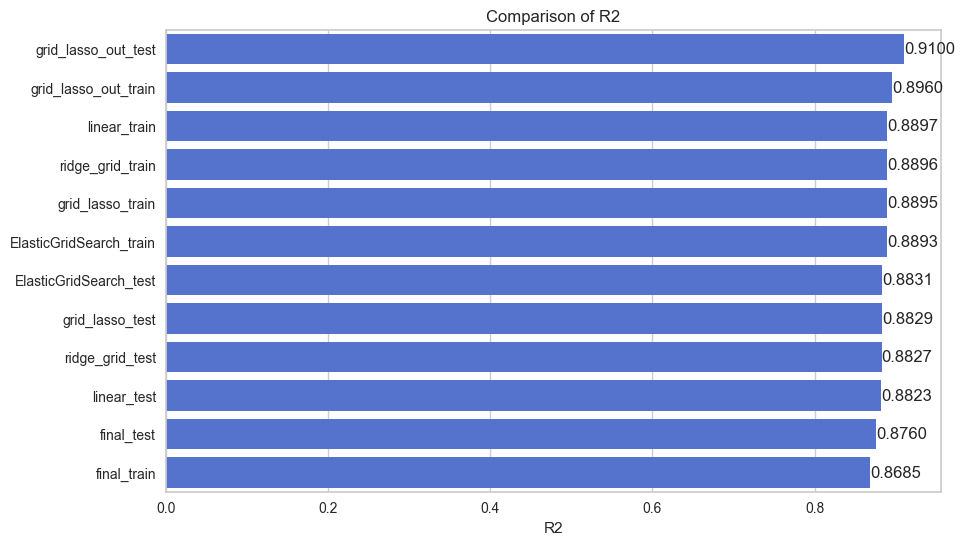

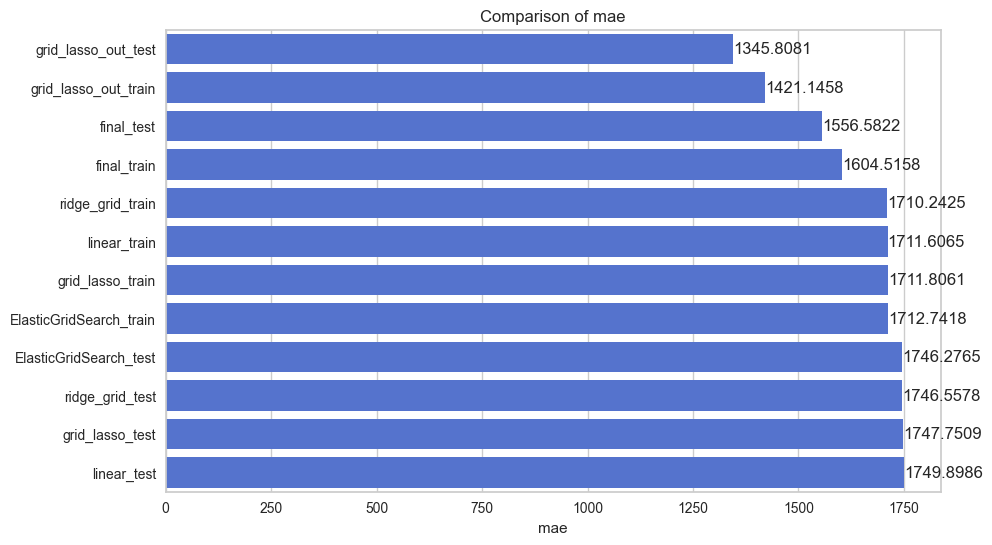

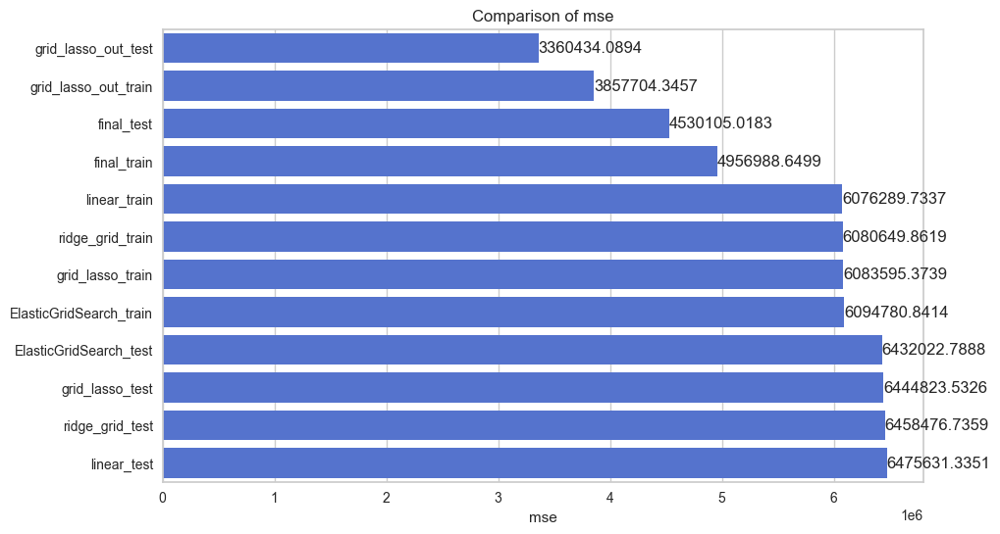

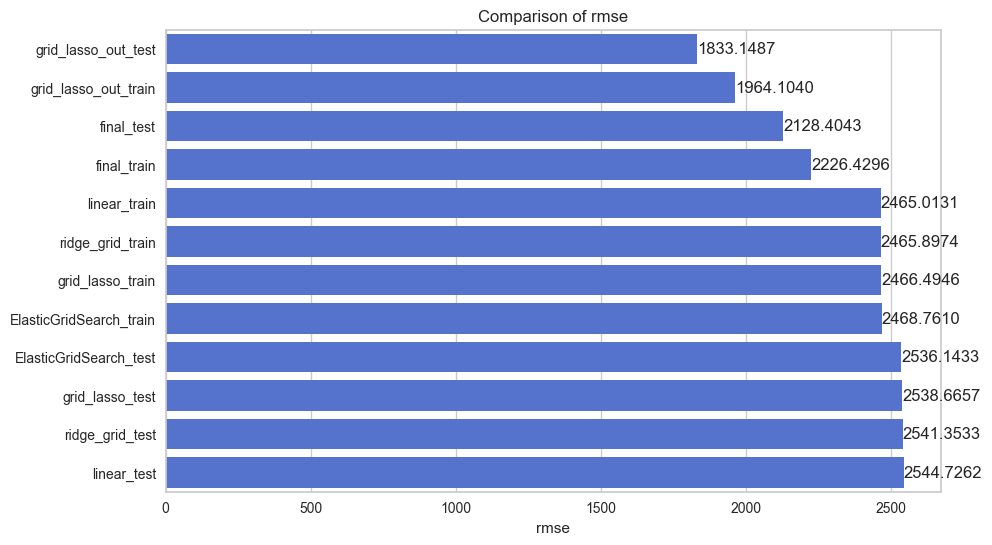

In [699]:
plot_metrics(result)

<a id="final-model-and-model-deployment"></a>
# <font color= #FFFFFF> <b>Final Model and Model Deployment</b><font color= #FFFFFF>

In [700]:
final_scaler = MinMaxScaler()
final_scaler.fit(X)
X_scaled = final_scaler.transform(X)

In [701]:
lasso_model = Lasso()

param_grid = {'alpha': alpha_space}

final_model = GridSearchCV(estimator=lasso_model,
                           param_grid=param_grid,
                           scoring='neg_root_mean_squared_error',
                           cv=10,
                           n_jobs=-1)

In [702]:
final_model.fit(X_scaled, y)

GridSearchCV(cv=10, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33,
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99,
       1.  ])},
             scoring='neg_root_mean_squared_error')

In [703]:
import pickle
pickle.dump(final_model, open("final_pipe_model", "wb"))

In [704]:
new_model = pickle.load(open("final_pipe_model", "rb"))

In [705]:
new_model

GridSearchCV(cv=10, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33,
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99,
       1.  ])},
             scoring='neg_root_mean_squared_error')

<a id="prediction"></a>
# <font color= #FFFFFF> <b>Prediction</b><font color= #FFFFFF>

## Prediction with new observation

In [706]:
my_dict = {
    "hp_kW": 66,
    "age": 2,
    "km": 17000,
    "make_model": 'Audi A3',
    "Gearing_Type": "Automatic"
}

In [707]:
my_dict = pd.DataFrame([my_dict])
my_dict = pd.get_dummies(my_dict)
my_dict = my_dict.reindex(columns=X.columns, fill_value=0)

In [708]:
my_dict = final_scaler.transform(my_dict)
my_dict

array([[0.13065327, 0.05362776, 0.66666667, 1.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        ]])

In [709]:
new_model.predict(my_dict)

array([19559.43338643])

In [716]:
random_samples = df_new.sample(n=50)

In [717]:
X_random = random_samples.drop(columns=["price"])
X_random = final_scaler.transform(X_random)
predictions = final_model.predict(X_random)

In [718]:
true_labels = random_samples["price"].values

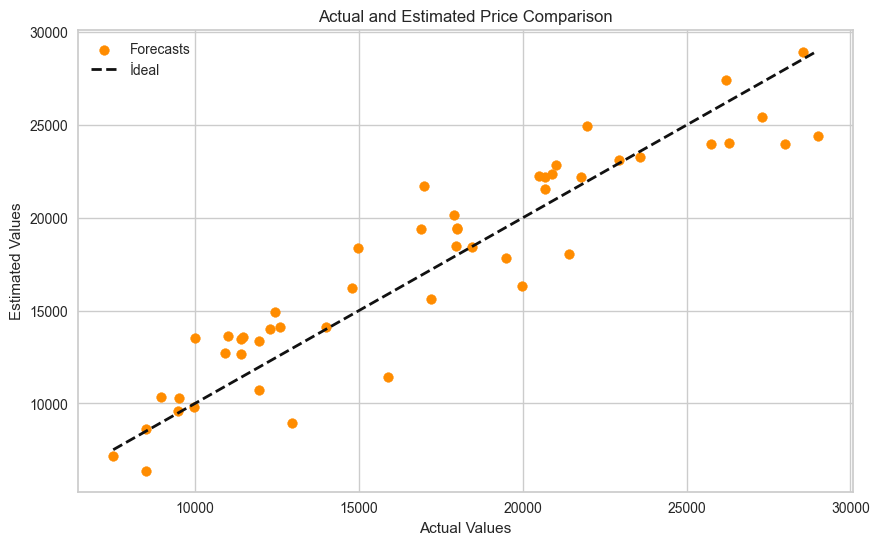

In [721]:
plt.figure(figsize=(10, 6))
plt.scatter(true_labels, predictions, color='darkorange', label='Forecasts')
plt.plot([min(true_labels), max(true_labels)], [min(true_labels), max(true_labels)], 'k--', lw=2, label='İdeal')
plt.xlabel('Actual Values')
plt.ylabel('Estimated Values')
plt.title('Actual and Estimated Price Comparison')
plt.legend()
plt.show()

<a id="conclusion"></a>
# <font color= #FFFFFF> <b>📂 Conclusion</b><font color= #FFFFFF>

**Project Summary and Conclusions**

- **Model Performance**:

The performance of the linear regression model was evaluated using R-squared and RMSE.
R-squared and RMSE indicate how well the model fits the data.
Impact of Features:

Significant predictors affecting the target variable were identified.
Feedback on model performance and data preprocessing steps was provided.
- **Future Work**:

Collect more data.
Conduct feature engineering.
Test more complex models.
- **Best Prediction Scores**:

The best prediction scores were obtained using the Lasso Grid model with outliers removed.
- **Feature Selection**:

Features increased by encoding and important features identified through Lasso were included in the model.
- **User-Friendly Model**:

A user-friendly model was developed.
The model is designed to be provided to the customer with minimal cost and effort.

**The reason for not using the model with the highest accuracy as the final model in this scenario:**

In data analysis and machine learning projects, achieving high performance using fewer features is an important goal. There are several reasons for this:

**Performance and Efficiency**
- Computational Cost: Using fewer features speeds up the training and prediction processes of the model. This is especially important in large datasets and real-time applications.
- Simplicity: Fewer features make the model simpler and more understandable. This increases the model's explainability and makes it more accessible to users.

**Model Generalization Capability**
- Overfitting: Using more features increases the risk of overfitting the model to the training data, which can reduce its performance on new data. Using fewer features can improve the model's generalization capability.
- Noise and Relevance: Not all features are equally important for the model. Regularization techniques like Ridge and Lasso can reduce the impact of irrelevant or less important features, thereby improving the model's performance.

**Data Collection and Processing Cost**
- Cost and Time: Using fewer features reduces the cost and time associated with data collection and processing. This cost reduction is particularly advantageous if the data collection process is expensive or time-consuming.

**Practicality**
- Applicability: Models with fewer features are more practical to implement. In situations where there is limited data collection capability or data scarcity, building a model with fewer important features is more feasible.


In conclusion, by focusing on the important features identified through models like Ridge and Lasso, you can create more efficient models in terms of both performance and cost. This strategy allows you to achieve high accuracy with fewer features, thereby reducing costs. Balancing this trade-off is often the key to achieving the best results.